In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import os
import torch
from PIL import Image
from IPython.display import Image as ImageDisplay
from utils import load_pickle
import faiss_utils
import numpy as np
from matplotlib.image import imread
from matplotlib.pyplot import figure, imshow, axis
from jupyter_utils import plot_time_jupyter, plot_scores_jupyter

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
def plot_2d_matrix(matrix, label_ticks, title, min_acc=None, max_acc=None, normalize_by_column=False, plotting_trick=True):
    if plotting_trick:
        matrix_score = matrix.copy()
        matrix = matrix / matrix.mean(axis=0).reshape(1,-1)
        cbar_str = "Test Accuracy"
        format_score = lambda s : f"{s:.2f}"
    elif normalize_by_column:
        matrix = matrix / matrix.mean(axis=0).reshape(1,-1)
        cbar_str = "Test Accuracy / Average Test accuracy per column"
        format_score = lambda s : f"{s:.2f}"
        matrix_score = matrix
    else:
        cbar_str = "Test Accuracy"
        format_score = lambda s : f"{s:.2%}"
        matrix_score = matrix
    
    plt.figure(figsize=(10,10))
    x = ["Test " + n for n in label_ticks]
    y = ['Train ' + n for n in label_ticks]
    p = plt.imshow(matrix, interpolation='none', cmap=f'Blues', vmin=min_acc, vmax=max_acc)
    cbar = plt.colorbar()
    
   
    cbar.ax.set_ylabel(f"{cbar_str}", rotation=-90, va="bottom")
    cbar.ax.set_ylim(bottom=min_acc, top=max_acc)
#         cbar.ax.invert_yaxis()

    plt.xticks(range(len(x)), x, fontsize=11, rotation = -90)
    plt.yticks(range(len(y)), y, fontsize=11)
    plt.title(title, fontsize=15)
    for i in range(len(x)):
        for j in range(len(y)):
            text = plt.text(j, i, format_score(matrix_score[i, j]),
                       ha="center", va="center", color="r")

def eval_2d_matrix(matrix):
#     if normalize_by_column:
#         matrix = matrix / matrix.mean(axis=0).reshape(1,-1)
    backward_transfer = np.tril(matrix, k=-1)
    backward_transfer = np.sum(backward_transfer) / np.count_nonzero(backward_transfer)
    forward_transfer = np.triu(matrix, k=1)
    forward_transfer = np.sum(forward_transfer) / np.count_nonzero(forward_transfer)
    accuracy = np.diag(matrix)
    accuracy = np.mean(accuracy)
    return accuracy, backward_transfer, forward_transfer

def eval_2d_matrix_nap(matrix):
    matrix = matrix[0, :].reshape(1,-1)
    matrix = np.repeat(matrix, matrix.shape[1] ,axis=0)
#     print(matrix)
    return eval_2d_matrix(matrix)

def new_eval_2d_matrix(matrix):
    average_of_lower_columns = []
    average_of_upper_columns = []
    average_of_diagonal = []
    for idx in range(matrix.shape[0]):
        if idx != 0:
            average_of_upper_columns.append(matrix[:idx, idx].mean())
        if idx != matrix.shape[0] - 1:
            average_of_lower_columns.append(matrix[idx+1:, idx].mean())
        average_of_diagonal.append(matrix[idx, idx])
    backward_transfer = sum(average_of_lower_columns) / len(average_of_lower_columns)
    forward_transfer = sum(average_of_upper_columns) / len(average_of_upper_columns)
    accuracy = sum(average_of_diagonal) / len(average_of_diagonal)

    return accuracy, backward_transfer, forward_transfer

def new_eval_2d_matrix_nap(matrix):
    matrix = matrix[0, :].reshape(1,-1)
    matrix = np.repeat(matrix, matrix.shape[1] ,axis=0)
#     print(matrix)
    return new_eval_2d_matrix(matrix)

def final_eval_2d_matrix(matrix):
    average_of_lower_columns = []
    average_of_lower_columns_including_diagonal = []
    average_of_upper_columns_above_plus_one_diagonal = []
    average_of_diagonal = []
    average_of_plus_one_diagonal = []
    average_of_all = []
    for idx in range(matrix.shape[0]):
        if idx > 1:
            average_of_upper_columns_above_plus_one_diagonal.append(matrix[:idx-1, idx].mean())
            average_of_plus_one_diagonal.append(matrix[idx-1, idx])
        if idx != matrix.shape[0] - 1:
            average_of_lower_columns.append(matrix[idx+1:, idx].mean())
        average_of_lower_columns_including_diagonal.append(matrix[idx:, idx].mean())
        average_of_all.append(matrix[:, idx].mean())
        average_of_diagonal.append(matrix[idx, idx])
    backward_transfer = sum(average_of_lower_columns) / len(average_of_lower_columns)
    backward_transfer_with_diag = sum(average_of_lower_columns_including_diagonal) / len(average_of_lower_columns_including_diagonal)
    plus_one_diag = sum(average_of_plus_one_diagonal) / len(average_of_plus_one_diagonal)
    forward_transfer_above_plus_one_diag = sum(average_of_upper_columns_above_plus_one_diagonal) / len(average_of_upper_columns_above_plus_one_diagonal)
    accuracy = sum(average_of_diagonal) / len(average_of_diagonal)
    overall = sum(average_of_all) / len(average_of_all)
    mean = matrix.mean()
    return mean, overall, accuracy, plus_one_diag, backward_transfer, backward_transfer_with_diag, forward_transfer_above_plus_one_diag

def final_eval_2d_matrix_nap(matrix):
    matrix = matrix[0, :].reshape(1,-1)
    matrix = np.repeat(matrix, matrix.shape[1] ,axis=0)
#     print(matrix)
    return final_eval_2d_matrix(matrix)

def main_eval_2d_matrix(matrix):
    _, _, accuracy, plus_one_diag, _, _, _ = final_eval_2d_matrix(matrix)
    return plus_one_diag, accuracy

def supp_eval_2d_matrix(matrix):
    _, backward_transfer, forward_transfer = eval_2d_matrix(matrix)
    accuracy, _, _ = dont_forget_eval_2d_matrix(matrix)
    online, offline = main_eval_2d_matrix(matrix)
    return online, offline, accuracy, backward_transfer, forward_transfer

def dont_forget_eval_2d_matrix(matrix):
    lower_trig_minus_diagonal = []
    upper_trig = []
    average_accuracy = []
    for idx in range(matrix.shape[0]):
        average_accuracy += list(matrix[idx:, idx]).copy()
        if idx != 0:
            upper_trig += list(matrix[:idx, idx]).copy()
        if idx != matrix.shape[0] - 1:
            lower_trig_minus_diagonal += list(matrix[idx+1:, idx] - matrix[idx, idx]).copy()

    backward_transfer = sum(lower_trig_minus_diagonal) / len(lower_trig_minus_diagonal)
    forward_transfer = sum(upper_trig) / len(upper_trig)
    accuracy = sum(average_accuracy) / len(average_accuracy)

    return accuracy, backward_transfer, forward_transfer

def dont_forget_eval_2d_matrix_nap(matrix):
    matrix = matrix[0, :].reshape(1,-1)
    matrix = np.repeat(matrix, matrix.shape[1] ,axis=0)
    return dont_forget_eval_2d_matrix(matrix)

def print_dict(dict):
    str = ""
    for k in dict:
        str += f"  {k}: {dict[k]:.2%}"
    print(str)
    
def print_per_class_accuracy(per_class_accuracy_dict, train_b1=1):
    for b_idx in per_class_accuracy_dict[train_b1]:
        per_class_acc = {}
        for class_name in per_class_accuracy_dict[train_b1][b_idx]:
            per_class_acc[class_name] = per_class_accuracy_dict[train_b1][b_idx][class_name]['corrects'] / \
                per_class_accuracy_dict[train_b1][b_idx][class_name]['counts']
        print(f"Train {train_b1}, Test Bucket {b_idx}")
        print_dict(per_class_acc)

In [3]:
def load(pickle_path):
    res = load_pickle(pickle_path)
    if type(res) == type(None):
        print(f"{pickle_path} does not exist yet")
        import pdb; pdb.set_trace()
    return res

def get_all_info(train_mode, metric, alpha_value_mode, alpha_value):
    if 'mlp' in train_mode:
        network = "MLP"
    else:
        network = "Linear"
    if "cumulative" in metric:
        mode = "Unlimited"
        alpha_str = "N/A"
    else:
        mode = "One Bucket"
        if alpha_value_mode == None:
            alpha_str = "CurrBucket"
        else:
            if alpha_value_mode == 'fixed':
                alpha_str = f"{alpha_value:.1f}"
            else:
                alpha_str = f"{alpha_value:.2f} * i/k"
    if 'retrain' in metric:
        t_mode = "From Scratch"
    elif metric == 'Nap':
        mode = 'N/A'
        alpha_str = 'N/A'
        t_mode = 'Nap'
    else:
        t_mode = "Finetuning"
    return network, mode, t_mode, alpha_str

def latex(mean, std):
    return f"${mean:.3f}\pm{std:.3f}$"

def latex_m(mean):
    return f"${mean:.3f}$"

def final_report_with_std(list_of_matrices):
    backwards = np.zeros((len(list_of_matrices)))
    forwards = np.zeros((len(list_of_matrices)))
    accs = np.zeros((len(list_of_matrices)))
    offlines = np.zeros((len(list_of_matrices)))
    onlines = np.zeros((len(list_of_matrices)))
    for idx, m in enumerate(list_of_matrices):
        online, offline, accuracy, backward_transfer, forward_transfer = supp_eval_2d_matrix(m)
        onlines[idx] = online
        offlines[idx] = offline
        accs[idx] = accuracy
        backwards[idx] = backward_transfer
        forwards[idx] = forward_transfer
    return (onlines.mean(), onlines.std()), (offlines.mean(), offlines.std()), (accs.mean(), accs.std()), (backwards.mean(), backwards.std()), (forwards.mean(), forwards.std())

def nap_final_report_with_std(list_of_matrices):
    backwards = np.zeros((len(list_of_matrices)))
    forwards = np.zeros((len(list_of_matrices)))
    accs = np.zeros((len(list_of_matrices)))
    offlines = np.zeros((len(list_of_matrices)))
    onlines = np.zeros((len(list_of_matrices)))
    for idx, m in enumerate(list_of_matrices):
        m = m[0, :].reshape(1,-1)
        m = np.repeat(m, m.shape[1] ,axis=0)
        online, offline, accuracy, backward_transfer, forward_transfer = supp_eval_2d_matrix(m)
        onlines[idx] = online
        offlines[idx] = offline
        accs[idx] = accuracy
        backwards[idx] = backward_transfer
        forwards[idx] = forward_transfer
    return (onlines.mean(), onlines.std()), (offlines.mean(), offlines.std()), (accs.mean(), accs.std()), (backwards.mean(), backwards.std()), (forwards.mean(), forwards.std())

In [4]:
# matrix  = np.array([[0.5, 0.4, 0.4, 0.4],\
#                     [0.8, 0.5, 0.4, 0.4],\
#                     [0.7, 0.65, 0.5, 0.4],\
#                     [0.75, 0.75, 0.65, 0.5]])
matrix  = np.array([[0.2, 0.4, 0.4, 0.4],\
                    [1.0, 0.4, 0.4, 0.4],\
                    [1.0, 1, 0.6, 0.4],\
                    [1.0, 1.0, 1, 0.8]])
mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix(matrix)
print(mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag)

online, offline, accuracy, backward_transfer, forward_transfer = supp_eval_2d_matrix(matrix)
print(online, offline, accuracy, backward_transfer, forward_transfer)

online, offline, accuracy, backward_transfer, forward_transfer = final_report_with_std([matrix, matrix])
print(online, offline, accuracy, backward_transfer, forward_transfer)

0.6499999999999999 0.65 0.5 0.4 1.0 0.8 0.4
0.4 0.5 0.7999999999999999 1.0 0.4000000000000001
(0.4, 0.0) (0.5, 0.0) (0.7999999999999999, 0.0) (1.0, 0.0) (0.4000000000000001, 0.0)


In [5]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 250

def plot_for_paper(matrices, title, min_acc=None, max_acc=None, save_path=None):
    matrix = matrices.mean(axis=0)
    cbar_str = "Test Accuracy"
    format_score = lambda s : f"{s:.2%}"
    matrix_score = matrix
    
    plt.figure(figsize=(11,11))
    x = ["Test " + str(n) for n in range(1,11)]
    y = ['Time ' + str(n) for n in range(1,11)]
    plt.imshow(matrix, interpolation='none', cmap=f'Blues', vmin=min_acc, vmax=max_acc)
#     cbar = plt.colorbar()
    
   
#     cbar.ax.set_ylabel(f"{cbar_str}", rotation=-90, va="bottom")
#     cbar.ax.set_ylim(bottom=min_acc, top=max_acc)
#         cbar.ax.invert_yaxis()

    plt.xticks(range(len(x)), x, fontsize=14, rotation = -90)
    plt.yticks(range(len(y)), y, fontsize=14)
    plt.title(title, fontsize=20)
    for i in range(len(x)):
        for j in range(len(y)):
            text = plt.text(j, i, format_score(matrix_score[i, j]),
                       ha="center", va="center", color="black", fontsize=15.5, family='monospace')
    if save_path:
        plt.savefig(save_path)

{'Algo': [], 'seed_None': [], 'seed_1': [], 'seed_10': [], 'seed_100': [], 'seed_1000': []}
moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_cumulative_retrain & $0.917\pm0.003$ & $0.912\pm0.002$ & $0.925\pm0.003$ & $0.926\pm0.003$ & $0.888\pm0.002$ \\
moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_cumulative_finetune & $0.923\pm0.003$ & $0.918\pm0.003$ & $0.931\pm0.002$ & $0.933\pm0.002$ & $0.893\pm0.003$ \\
moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned__napping & $0.866\pm0.002$ & $0.860\pm0.003$ & $0.877\pm0.002$ & $0.880\pm0.002$ & $0.853\pm0.003$  \\
moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_fixed_0.25_finetune & $0.888\pm0.005$ & $0.881\pm0.006$ & $0.897\pm0.005$ & $0.898\pm0.005$ & $0.869\pm0.004$ \\
moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_fixed_0.25_retrain & $0.876\pm0.003$ & $0.867\pm0.004$ & $0.883\pm0.003$ & $0.885\pm0.003$ & $0.858\pm0.002$ \\
moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_fixed_0.5_finetune & $0.892\pm0.004$ & $0.883\pm0.004$ & $0.900\pm0.004$ 

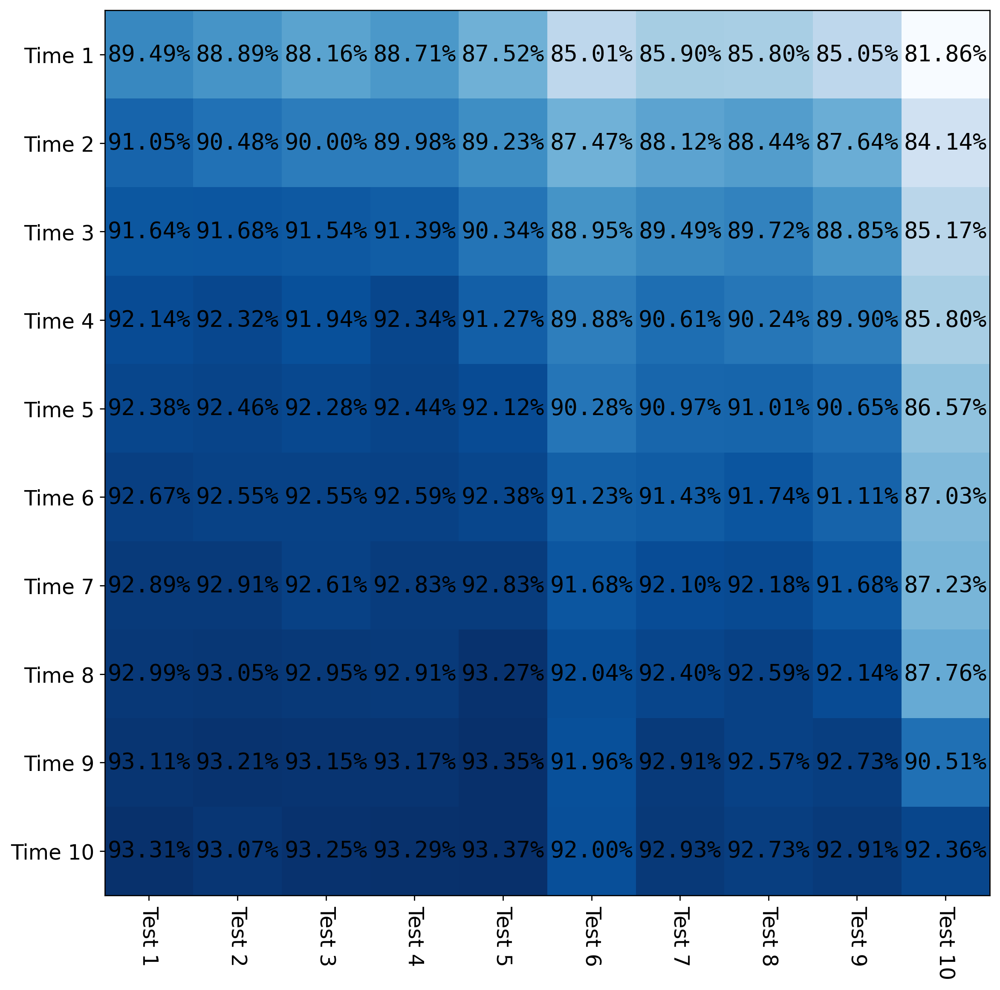

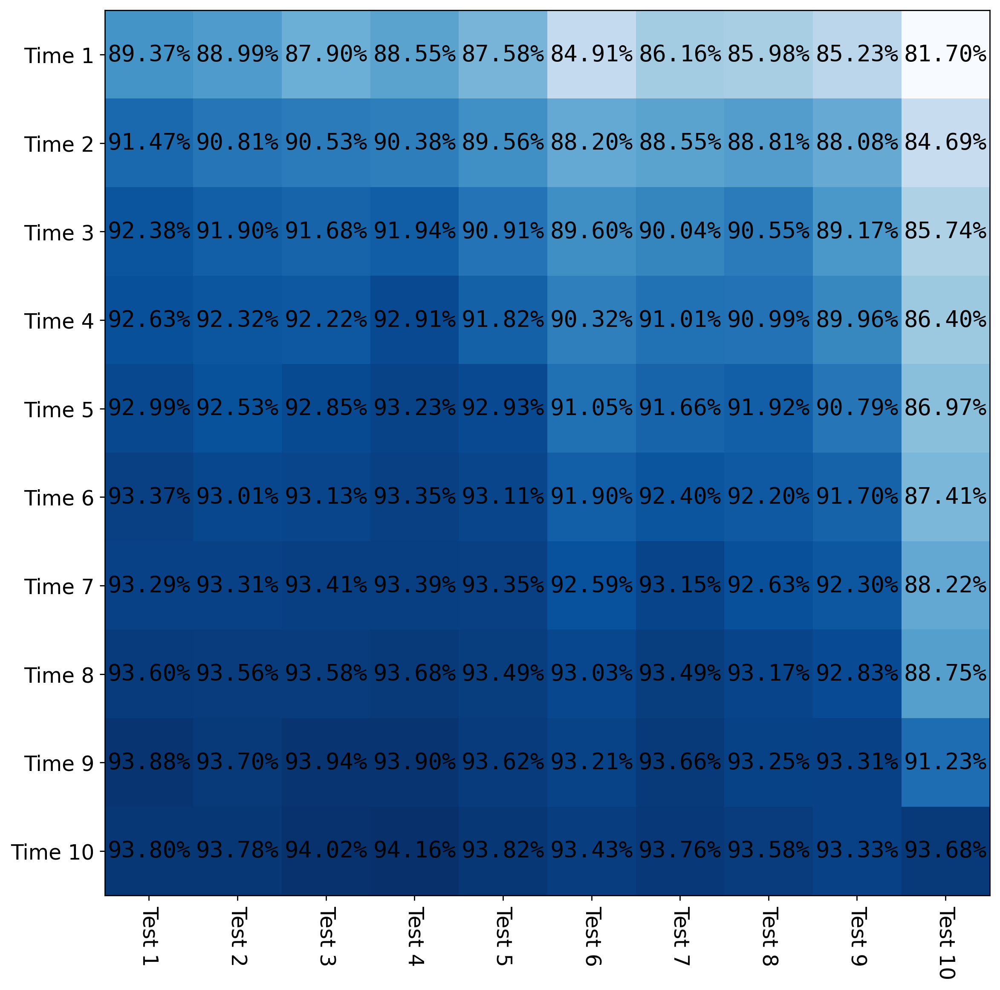

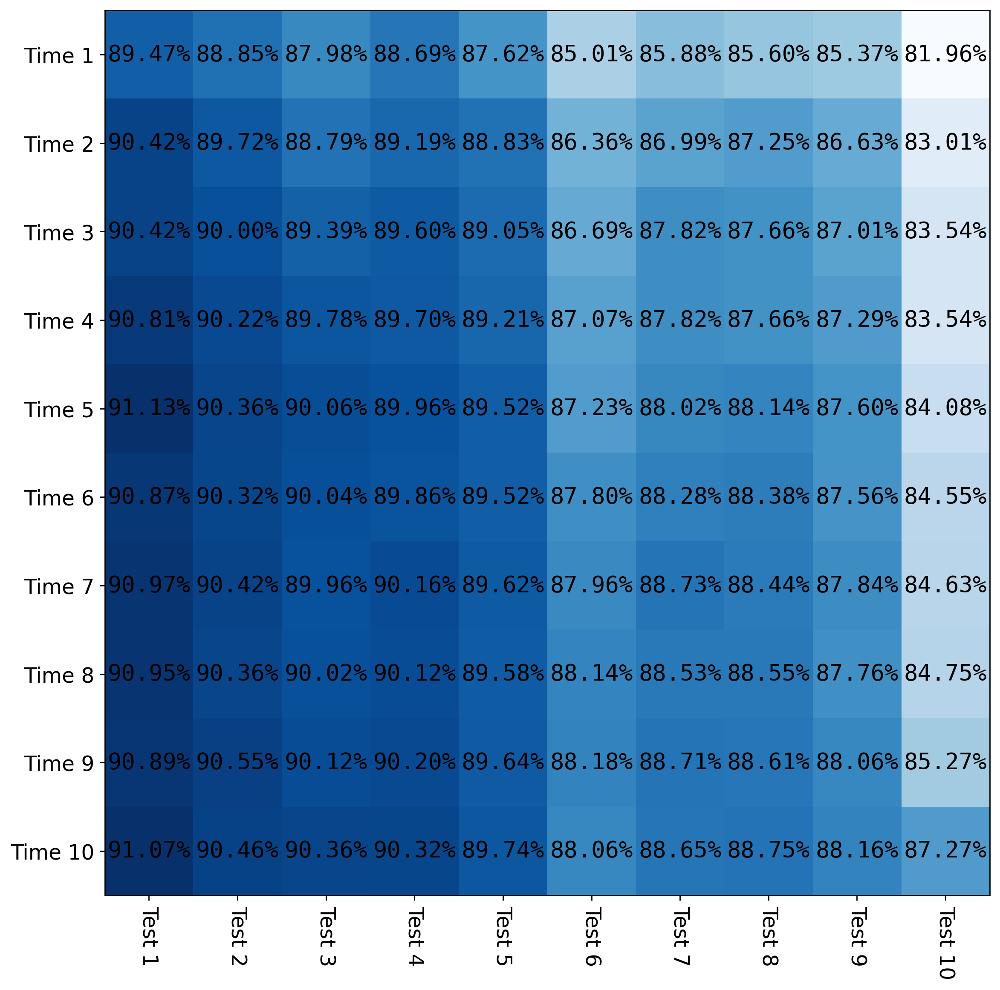

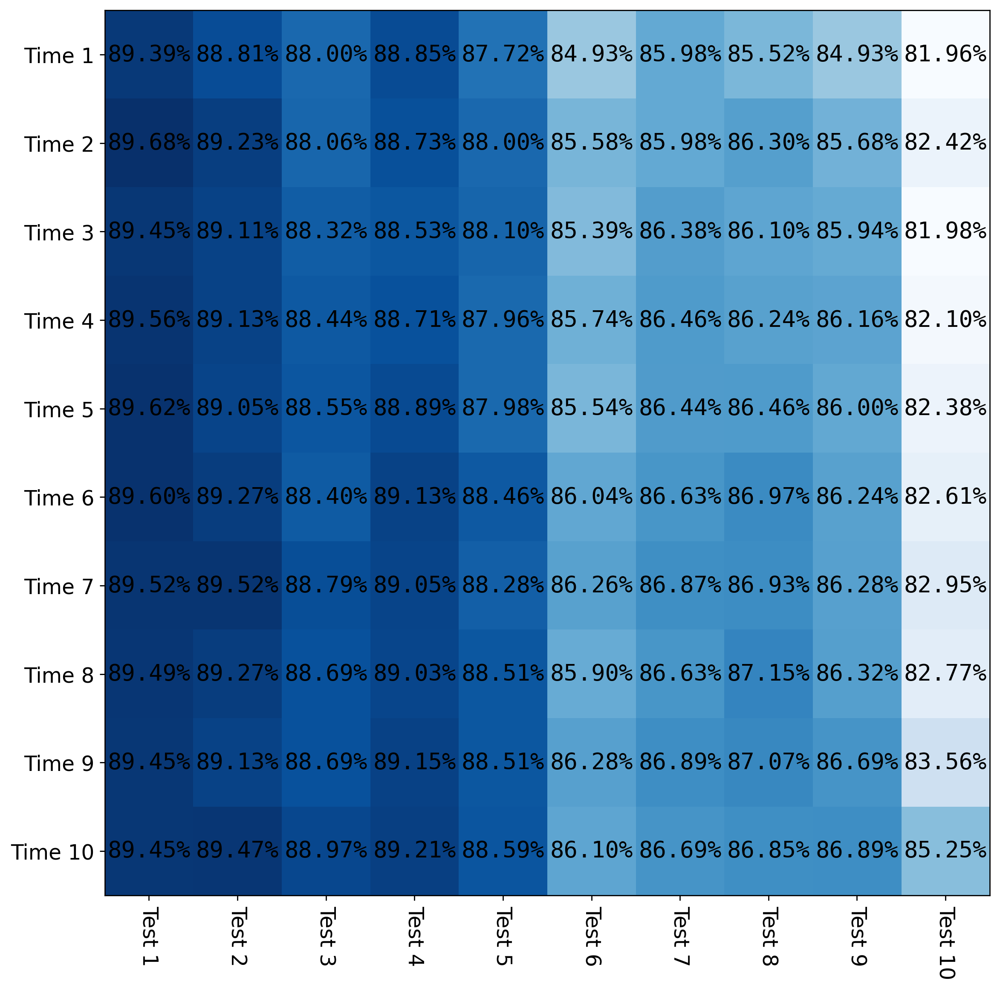

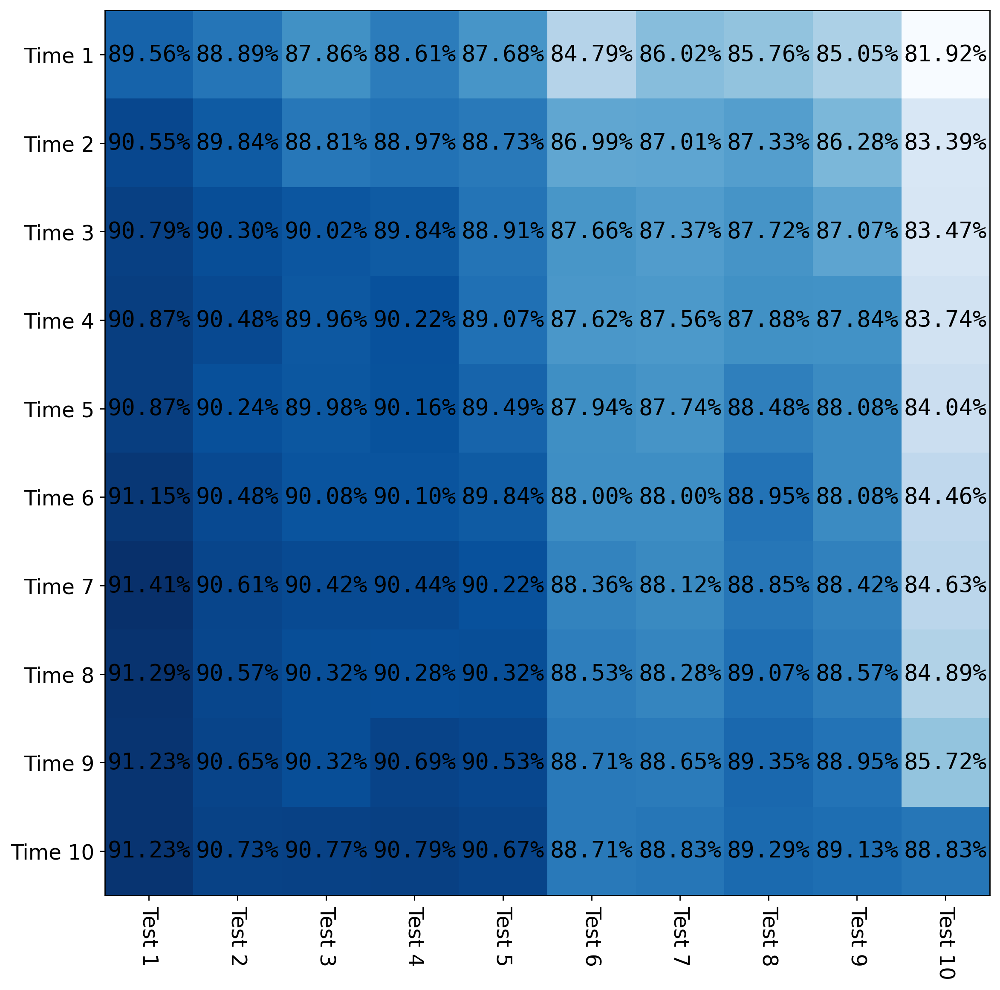

...

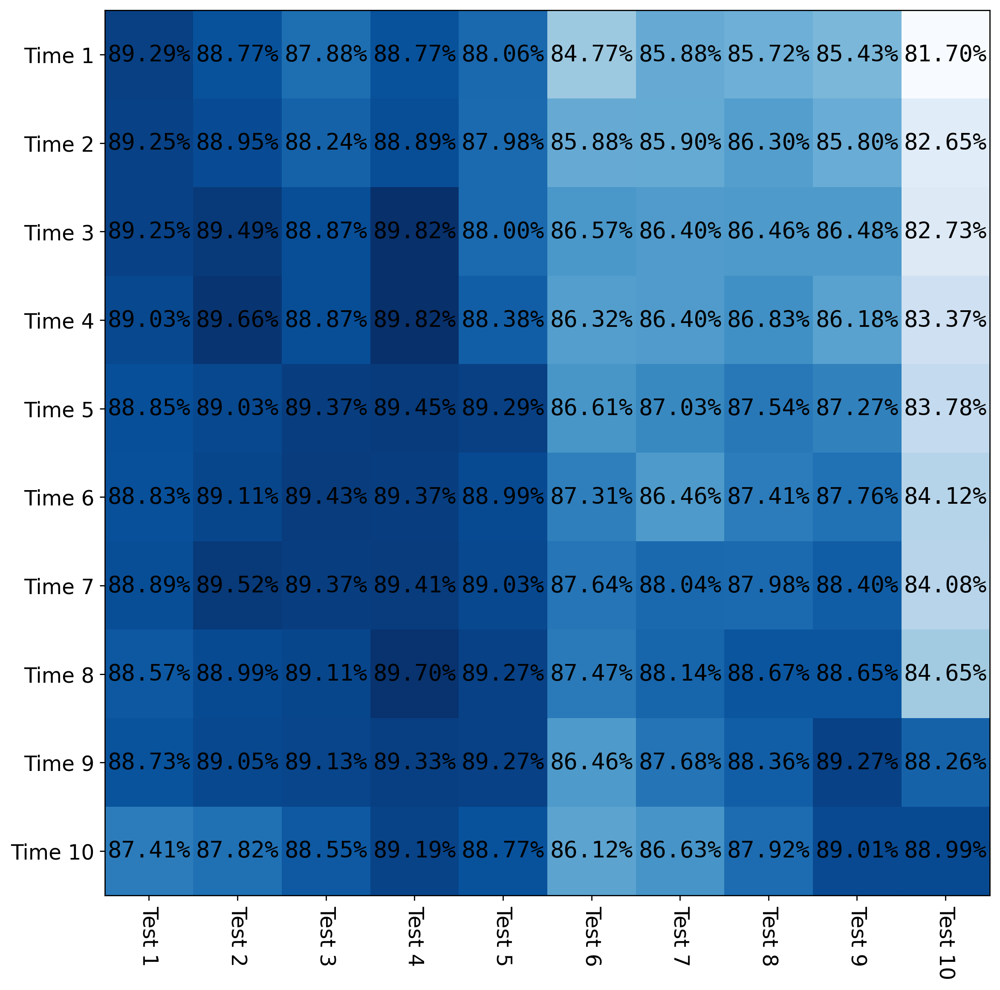

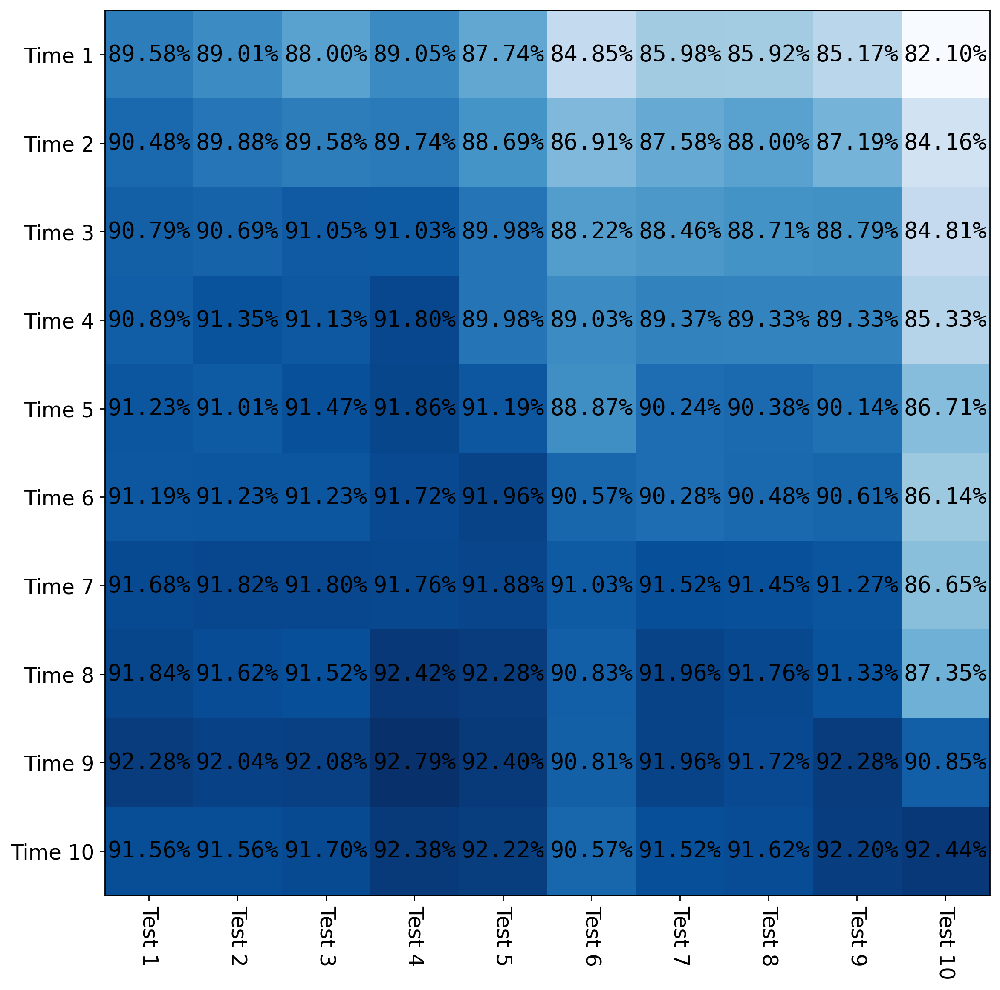

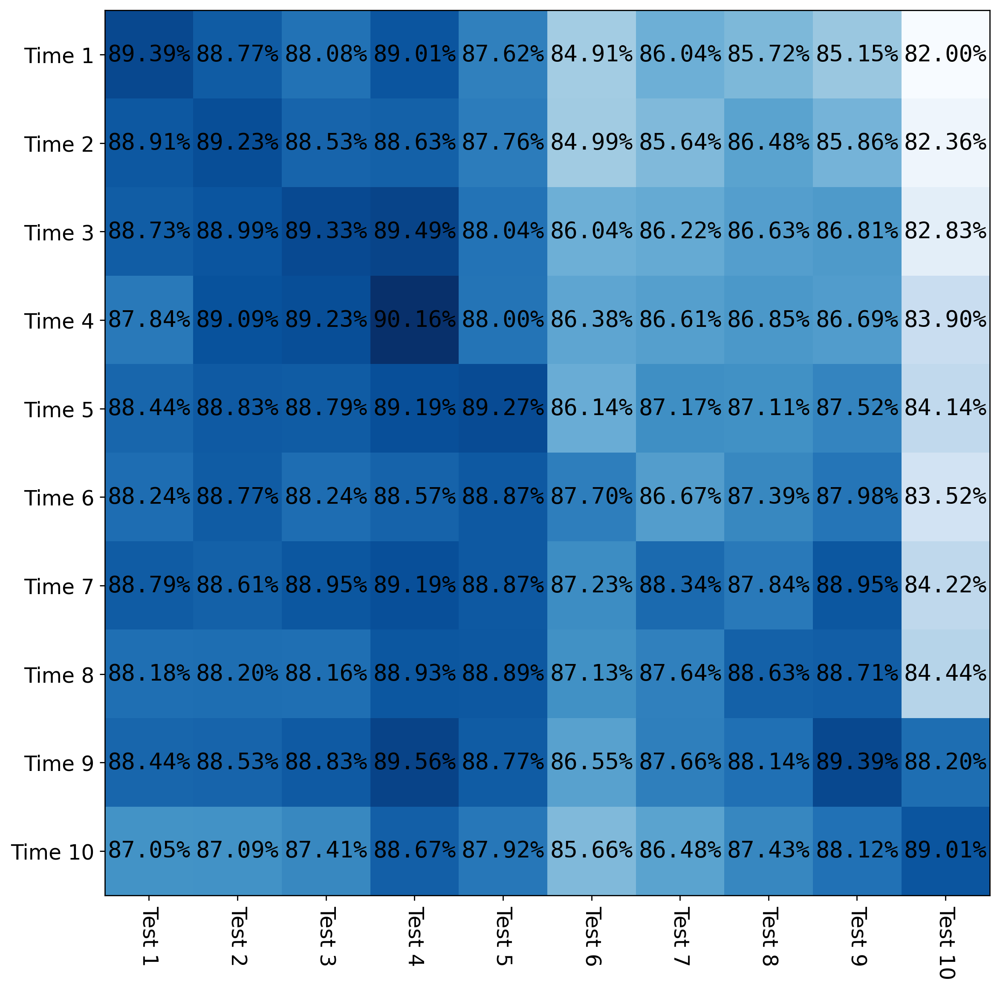

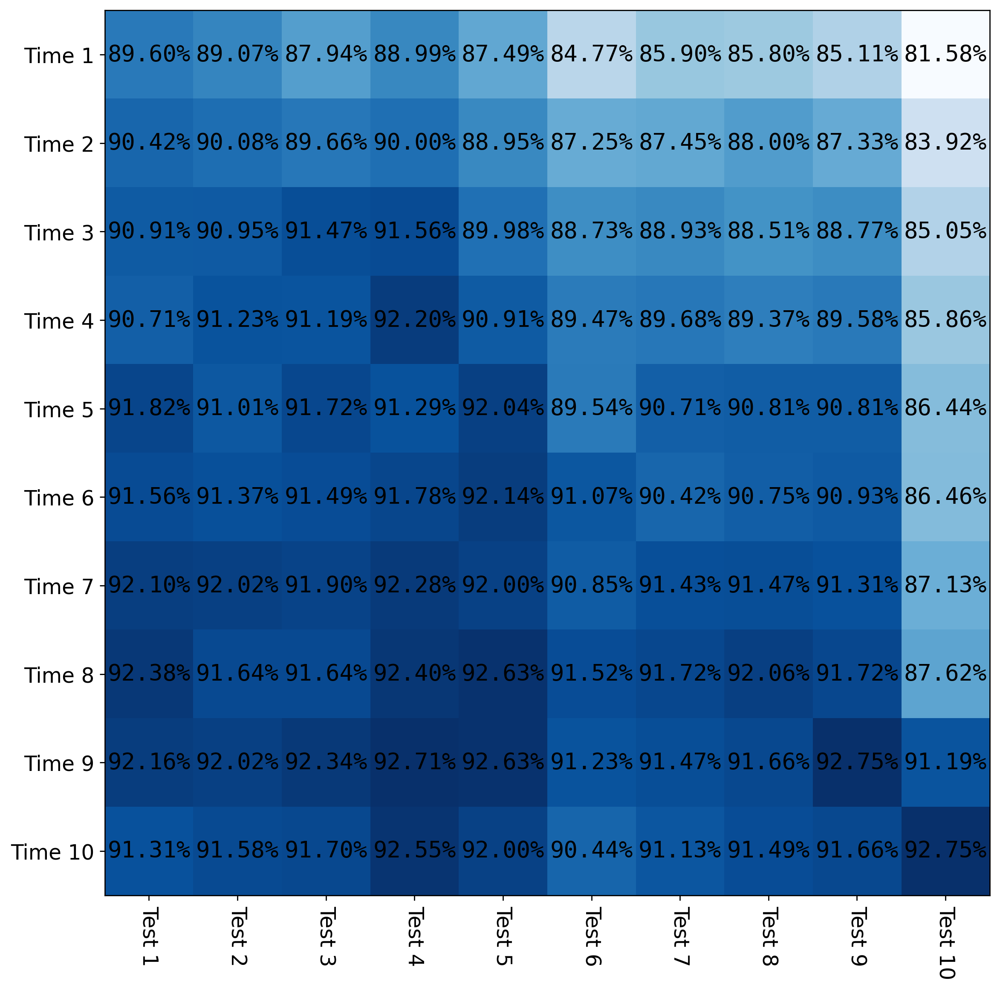

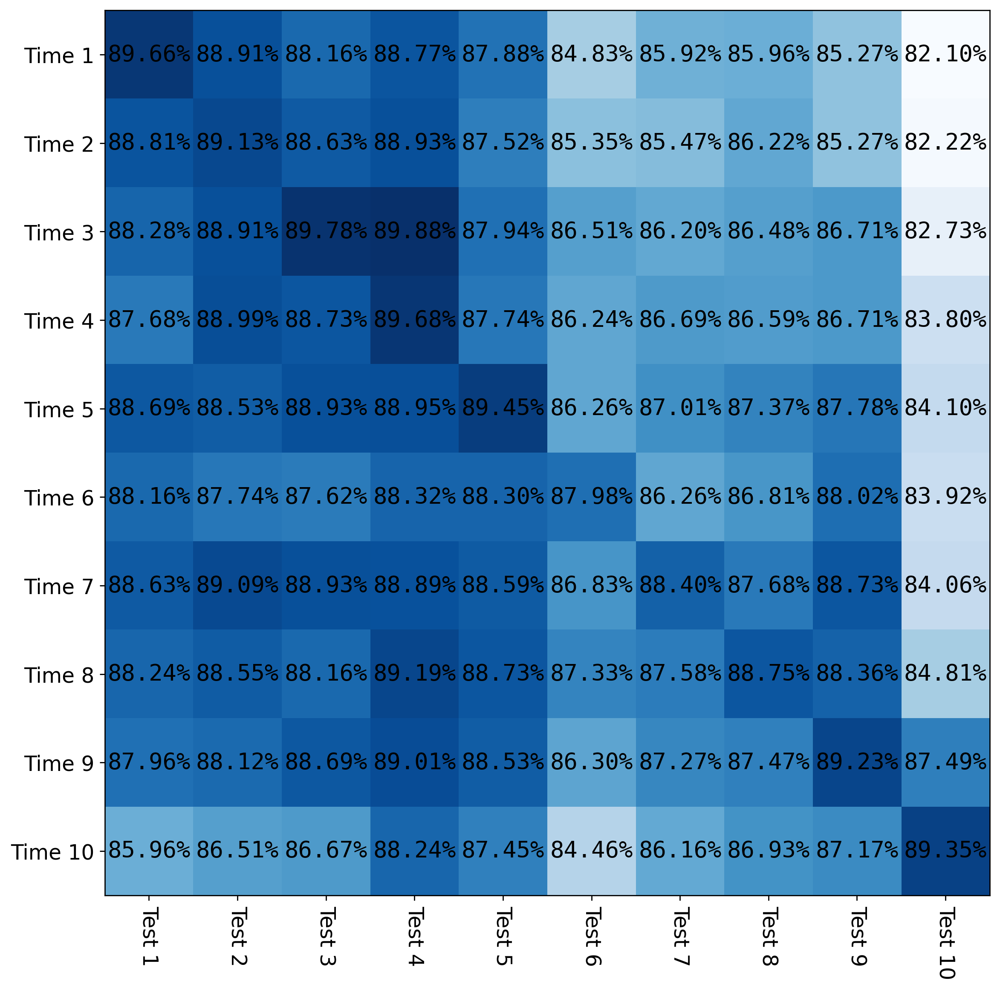

In [9]:
# Plotting all 5 experiment with seed
table_dir = "/data3/zhiqiul/yfcc_dynamic_10/dynamic_300_tables/"

name =  "/data3/zhiqiul/yfcc_dynamic_10/"
query_title = "none"


data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_single_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
# for train_mode in ['moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned']:
for train_mode in [
#                     'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_batch_8',
#                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_batch_8',
                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
#                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear'
                  ]:
    exp_result_save_path = os.path.join(name, label_set)
    name_str = f"{train_mode}_"

    all_res[name_str+'cumulative_retrain'] = np.zeros((len(seed_list), 10,10))
    all_res[name_str+'cumulative_finetune'] = np.zeros((len(seed_list), 10,10))
    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)
        results_dict_sequential_retrain_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_cumulative_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path = os.path.join(exp_result_save_path,
                                                             f"results_dict_cumulative_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")

        results_dict_sequential_retrain = load(results_dict_sequential_retrain_path)
        results_dict_sequential_finetune = load(results_dict_sequential_finetune_path)

        all_res[name_str+'cumulative_retrain'][idx] = results_dict_sequential_retrain['b1_b2_accuracy_matrix']
        all_res[name_str+"cumulative_finetune"][idx] = results_dict_sequential_finetune['b1_b2_accuracy_matrix']
        
        
    all_k = [name_str+'cumulative_retrain', name_str+'cumulative_finetune']
    for k in all_k:
        result = final_report_with_std(all_res[k])
        online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
        (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
#         network, mode, t_mode, alpha_str = get_all_info(train_mode, k, None, None)
        latex_str = f"{k} & {latex(*offline_stats)} & {latex(*online_stats)} & {latex(*accs_stats)} & {latex(*bwd_stats)} & {latex(*fwd_stats)} \\\\"
        print(latex_str)
        plot_for_paper(all_res[k], "", save_path=os.path.join(table_dir,k+".png"))

    nap_result = nap_final_report_with_std(all_res[all_k[0]])
    online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = nap_result
#     network, mode, t_mode, alpha_str = get_all_info(train_mode, 'Nap', None, None)
    latex_str = f"{name_str}_napping & {latex(*offline_stats)} & {latex(*online_stats)} & {latex(*accs_stats)} & {latex(*bwd_stats)} & {latex(*fwd_stats)}  \\\\"
    print(latex_str)

    for alpha_value_mode in ALPHA_VALUE_DICT:
        for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
            all_runs = np.ones((len(seed_list)))
            name_str = f"{train_mode}_{alpha_value_mode}_{alpha_value}"
            all_res[name_str+'_retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[name_str+'_finetune'] = np.zeros((len(seed_list), 10,10))


            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_singlememory_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_singlememory_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load_pickle(results_dict_alpha_retrain_path)
                if type(results_dict_alpha_retrain) == type(None):
                    print(f"{results_dict_alpha_retrain_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
                
                results_dict_alpha_finetune = load_pickle(results_dict_alpha_finetune_path)
                if type(results_dict_alpha_finetune) == type(None):
                    print(f"{results_dict_alpha_finetune_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
            
                all_res[name_str+'_retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
                all_res[name_str+"_finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
                     
            table['Algo'].append(f"{name_str}")
            all_k = [name_str+'_finetune', name_str+'_retrain']
            for k in all_k:
                result = final_report_with_std(all_res[k])
                online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
                (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
                network, mode, t_mode, alpha_str = get_all_info(train_mode, k, alpha_value_mode, alpha_value)
                latex_str = f"{k} & {latex(*offline_stats)} & {latex(*online_stats)} & {latex(*accs_stats)} & {latex(*bwd_stats)} & {latex(*fwd_stats)} \\\\"
                print(latex_str)
                plot_for_paper(all_res[k], "", save_path=os.path.join(table_dir,k+".png"))
#                 print(f"Save at {os.path.join(table_dir,k+'.png')}")
    
print(tabulate(table))

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_single_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
train_modes = [
                                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
                    'moco_v2_imgnet_linear_tuned',
                        'linear_tuned',
                   'mlp',  
                    'imgnet_linear', 
                  'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
                  'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 
                    'imgnet_mlp', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', 
                  ]
# train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned'
# train_modes = ['moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp',
#               'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_2']
# prefix = len("moco_v2_yfcc_feb18_bucket_0_gpu_8_")
prefix = len("")

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for train_mode in ['moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned']:
    name_str = f"{train_mode[prefix:]}_"
    all_res[name_str+'single_retrain'] = np.zeros((len(seed_list), 10,10))
    all_res[name_str+'single_finetune'] = np.zeros((len(seed_list), 10,10))
    all_res[name_str+'cumulative_retrain'] = np.zeros((len(seed_list), 10,10))
    all_res[name_str+'cumulative_finetune'] = np.zeros((len(seed_list), 10,10))
    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)
        results_dict_single_path = os.path.join(exp_result_save_path,
                                                f"results_dict_online_single_with_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_single_finetune_path = os.path.join(exp_result_save_path,
                                                         f"results_dict_online_single_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_retrain_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_online_sequential_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_online_sequential_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
    
        results_dict_single_retrain = load(results_dict_single_path)
        results_dict_single_finetune = load(results_dict_single_finetune_path)
        results_dict_sequential_retrain = load(results_dict_sequential_retrain_path)
        results_dict_sequential_finetune = load(results_dict_sequential_finetune_path)


        
        
            
        all_res[name_str+'single_retrain'][idx] = results_dict_single_retrain['b1_b2_accuracy_matrix_all']
        all_res[name_str+"single_finetune"][idx] = results_dict_single_finetune['b1_b2_accuracy_matrix_all']
        all_res[name_str+'cumulative_retrain'][idx] = results_dict_sequential_retrain['b1_b2_accuracy_matrix_all']
        all_res[name_str+"cumulative_finetune"][idx] = results_dict_sequential_finetune['b1_b2_accuracy_matrix_all']
    

#     all_res[name_str+'single_retrain'] = all_res[name_str+"single_retrain"].mean(axis=0)
#     all_res[name_str+"single_finetune"] = all_res[name_str+"single_finetune"].mean(axis=0)
#     all_res[name_str+'cumulative_retrain'] = all_res[name_str+"cumulative_retrain"].mean(axis=0)
#     all_res[name_str+"cumulative_finetune"] = all_res[name_str+"cumulative_finetune"].mean(axis=0)


#     metrics = [name_str+'single_retrain', name_str+'single_finetune', name_str+"cumulative_retrain", name_str+"cumulative_finetune"]
#     for metric in metrics:
#         mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix(all_res[metric])
#         print(f"{metric:30s}--> Mean: {mean:.3f}; Overall: {overall:.3f}; Diag: {diag:.3f}; +1Diag: {plus_one_diag:.3f}; back: {back:.3f}; back_diag: {back_with_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
# #         latex_str += f"${mean:.3f}$ & ${overall:.3f}$ & ${diag:.3f}$ & ${plus_one_diag:.3f}$ & ${back:.3f}$ & ${back_with_diag:.3f}$ & ${forward_above_plus_one_diag:.3f}$"
#         network, mode, t_mode, alpha_str = get_all_info(train_mode, metric, None, None)
#         latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} & ${plus_one_diag:.3f}$ \\"
#         print(latex_str)
    all_k = [name_str+'single_retrain', name_str+'cumulative_retrain', name_str+'single_finetune',  name_str+'cumulative_finetune']
    for k in all_k:
        result = final_report_with_std(all_res[k])
        online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
        (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
        network, mode, t_mode, alpha_str = get_all_info(train_mode, k, None, None)
        latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} & {latex(*online_stats)} & {latex(*fwd_stats)} \\\\"
        print(latex_str)
        #  print("////////////Online End///////////////")
    nap_result = nap_final_report_with_std(all_res[all_k[1]])
    online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = nap_result
    network, mode, t_mode, alpha_str = get_all_info(train_mode, 'Nap', None, None)
    latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} & {latex(*online_stats)} & {latex(*fwd_stats)} \\\\"
    print(latex_str)


    
    for alpha_value_mode in ALPHA_VALUE_DICT:
        for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
            exp_result_save_path = os.path.join(name, label_set)
            all_runs = np.ones((len(seed_list)))
            name_str = f"{train_mode[prefix:]}_{alpha_value_mode}_{alpha_value}"
#             network_type = TRAIN_MODES_CATEGORY[train_mode].network_type
#             feature_type = TRAIN_MODES_CATEGORY[train_mode].feature_type
#             pretrained_weight = TRAIN_MODES_CATEGORY[train_mode].pretrained_weight
            all_res[name_str+'_retrain_all'] = np.zeros((len(seed_list), 10,10))
            all_res[name_str+'_finetune_all'] = np.zeros((len(seed_list), 10,10))


            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_online_singlememory_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_online_singlememory_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load(results_dict_alpha_retrain_path)
                
                results_dict_alpha_finetune = load(results_dict_alpha_finetune_path)

            
#                 all_res[name_str+'_retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
#                 all_res[name_str+"_finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']
                all_res[name_str+'_retrain_all'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix_all']
                all_res[name_str+"_finetune_all"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix_all']
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
        
#             try:
#                 all_bucket = [i for i in list(results_dict_alpha_finetune['accuracy'].keys())]
#             except:
#                 continue
        
#             all_bucket_str_single = [f"Time {i}" for i in all_bucket]
        
#             all_res[name_str+'_retrain'] = all_res[name_str+"_retrain"].mean(axis=0)
#             all_res[name_str+"_finetune"] = all_res[name_str+"_finetune"].mean(axis=0)
#             all_res[name_str+'_retrain_all'] = all_res[name_str+"_retrain_all"].mean(axis=0)
#             all_res[name_str+"_finetune_all"] = all_res[name_str+"_finetune_all"].mean(axis=0)
              
#             plot_2d_matrix(all_res[name_str+'_retrain'],
#                            all_bucket_str_single,
#                            title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
#                            normalize_by_column=False,
#                            plotting_trick=False
#             )
        
#             plot_2d_matrix(all_res[name_str+'_finetune'],
#                            all_bucket_str_single,
#                            title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
#                            normalize_by_column=False,
#                            plotting_trick=False
#             )
        
        
        
#             metrics = [name_str+'_retrain_all', name_str+'_finetune_all']
#             for metric in metrics:
#                 latex_str = ""
#                 mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix(all_res[metric])
#                 print(f"{metric:30s}--> Mean: {mean:.3f}; Overall: {overall:.3f}; Diag: {diag:.3f}; +1Diag: {plus_one_diag:.3f}; back: {back:.3f}; back_diag: {back_with_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
#                 latex_str += f"${mean:.3f}$ & ${overall:.3f}$ & ${diag:.3f}$ & ${plus_one_diag:.3f}$ & ${back:.3f}$ & ${back_with_diag:.3f}$ & ${forward_above_plus_one_diag:.3f}$"
#                 print(latex_str)
#             for metric in metrics:
#                 mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix_nap(all_res[metric])
#                 print(f"{metric:30s} (NAPPING!!)--> Mean: {mean:.3f}; Overall: {overall:.3f}; Diag: {diag:.3f}; +1Diag: {plus_one_diag:.3f}; back: {back:.3f}; back_diag: {back_with_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
            
#             metrics = [name_str+'_retrain_all', name_str+'_finetune_all']
#             for metric in metrics:
#                 mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix(all_res[metric])
#                 print(f"{metric:30s} (ALL) --> +1Diag: {plus_one_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
#                 network, mode, t_mode, alpha_str = get_all_info(train_mode, metric, alpha_value_mode, alpha_value)
#                 latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} & ${plus_one_diag:.3f}$ \\"
#                 print(latex_str)

            table['Algo'].append(f"{name_str}")
            all_k = [name_str+'_retrain_all']
#             all_k = [name_str+'_finetune_all']
            for k in all_k:
                result = final_report_with_std(all_res[k])
                online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
                (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
                network, mode, t_mode, alpha_str = get_all_info(train_mode, k, alpha_value_mode, alpha_value)
                latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} & {latex(*online_stats)} & {latex(*fwd_stats)} \\\\"
                print(latex_str)
                #  print("////////////Online End///////////////")

print(train_mode)
print(tabulate(table))

In [ ]:
def get_all_info(train_mode, metric, alpha_value_mode, alpha_value):
    if 'mlp' in train_mode:
        network = "MLP"
    else:
        network = "Linear"
    if "cumulative" in metric:
        mode = "Unlimited"
        alpha_str = "N/A"
    else:
        mode = "One Bucket"
        if alpha_value_mode == None:
            alpha_str = "CurrBucket"
        else:
            if alpha_value_mode == 'fixed':
                alpha_str = f"{alpha_value:.1f}"
            else:
                alpha_str = f"{alpha_value:.2f} * i/k"
    if 'retrain' in metric:
        t_mode = "From Scratch"
    elif metric == 'Nap':
        mode = 'N/A'
        alpha_str = 'N/A'
        t_mode = 'Nap'
    else:
        t_mode = "Finetuning"
    return network, mode, t_mode, alpha_str

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_single_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
linear_modes = [
                   'linear_tuned',
                    'imgnet_linear', 
                  'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',]
mlp_modes    =   ['mlp', 
                                      'imgnet_mlp', 
                  'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', ]

# modes = linear_modes
# mode_str = 'linear'

modes = mlp_modes
mode_str = 'mlp'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for train_mode in modes:
    exp_result_save_path = os.path.join(name, label_set)
    all_res[train_mode] = {}
#     all_res[train_mode]['single_retrain'] = np.zeros((len(seed_list), 10,10))
#     all_res[train_mode]['single_finetune'] = np.zeros((len(seed_list), 10,10))
    all_res[train_mode]['cumulative_retrain'] = np.zeros((len(seed_list), 10,10))
    all_res[train_mode]['cumulative_finetune'] = np.zeros((len(seed_list), 10,10))
#     all_res[train_mode]['single_retrain_all_online'] = np.zeros((len(seed_list), 10,10))
#     all_res[train_mode]['single_finetune_all_online'] = np.zeros((len(seed_list), 10,10))
    all_res[train_mode]['cumulative_retrain_all_online'] = np.zeros((len(seed_list), 10,10))
    all_res[train_mode]['cumulative_finetune_all_online'] = np.zeros((len(seed_list), 10,10))
    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)
        results_dict_sequential_retrain_path_all = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path_all = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
#         results_dict_single_retrain_path_all = os.path.join(exp_result_save_path,
#                                                                f"results_dict_single_with_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
#         results_dict_single_finetune_path_all = os.path.join(exp_result_save_path,
#                                                                        f"results_dict_single_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")

#         results_dict_single_retrain_all = load(results_dict_single_retrain_path_all)
#         results_dict_single_finetune_all = load(results_dict_single_finetune_path_all)
        results_dict_sequential_retrain_all = load(results_dict_sequential_retrain_path_all)
        results_dict_sequential_finetune_all = load(results_dict_sequential_finetune_path_all)
        
#         all_res[train_mode]['single_retrain'][idx] = results_dict_single_retrain_all['b1_b2_accuracy_matrix']
#         all_res[train_mode]["single_finetune"][idx] = results_dict_single_finetune_all['b1_b2_accuracy_matrix']
        all_res[train_mode]['cumulative_retrain'][idx] = results_dict_sequential_retrain_all['b1_b2_accuracy_matrix']
        all_res[train_mode]["cumulative_finetune"][idx] = results_dict_sequential_finetune_all['b1_b2_accuracy_matrix']
        
#         all_res[train_mode]['single_retrain_all_online'][idx] = results_dict_single_retrain_all['b1_b2_accuracy_matrix_all']
#         all_res[train_mode]["single_finetune_all_online"][idx] = results_dict_single_finetune_all['b1_b2_accuracy_matrix_all']
        all_res[train_mode]['cumulative_retrain_all_online'][idx] = results_dict_sequential_retrain_all['b1_b2_accuracy_matrix_all']
        all_res[train_mode]["cumulative_finetune_all_online"][idx] = results_dict_sequential_finetune_all['b1_b2_accuracy_matrix_all']
    
    all_res[train_mode]['alpha'] = {}
    print(train_mode)
    for alpha_value_mode in ALPHA_VALUE_DICT:
        all_res[train_mode]['alpha'][alpha_value_mode] = {}
        for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
            print(alpha_value_mode, alpha_value)
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value] = {}
            all_runs = np.ones((len(seed_list)))
#             name_str = f"{train_mode[prefix:]}_{alpha_value_mode}_{alpha_value}"
#             network_type = TRAIN_MODES_CATEGORY[train_mode].network_type
#             feature_type = TRAIN_MODES_CATEGORY[train_mode].feature_type
#             pretrained_weight = TRAIN_MODES_CATEGORY[train_mode].pretrained_weight
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['finetune'] = np.zeros((len(seed_list), 10,10))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain_all'] = np.zeros((len(seed_list), 10,10))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['finetune_all'] = np.zeros((len(seed_list), 10,10))


            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_singlememory_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_singlememory_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load_pickle(results_dict_alpha_retrain_path)
                if type(results_dict_alpha_retrain) == type(None):
                    print(f"{results_dict_alpha_retrain_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
                
                results_dict_alpha_finetune = load_pickle(results_dict_alpha_finetune_path)
                if type(results_dict_alpha_finetune) == type(None):
                    print(f"{results_dict_alpha_finetune_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
            
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]["finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain_all'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix_all']
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]["finetune_all"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix_all']
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
        
            
            table['Algo'].append(f"{name_str}")



print(tabulate(table))

In [ ]:
network, mode, t_mode, alpha_str = get_all_info(mode_str, "Nap", None, None)
latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
for train_mode in modes:
    result = nap_final_report_with_std(all_res[train_mode]["cumulative_finetune"])
    online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
    latex_str += f"& {latex(*offline_stats)} "
for train_mode in modes:
    result = nap_final_report_with_std(all_res[train_mode]["cumulative_finetune"])
    online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
    latex_str += f"& {latex(*online_stats)} "
latex_str += "\\\\"
print(latex_str)

cumulative_offlines = ['cumulative_retrain', 'cumulative_finetune']


for metric in cumulative_offlines:
    network, mode, t_mode, alpha_str = get_all_info(mode_str, metric, None, None)
    latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
    for train_mode in modes:
        result = final_report_with_std(all_res[train_mode][metric])
        online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
#         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
        latex_str += f"& {latex(*offline_stats)} "
    for train_mode in modes:
        result = final_report_with_std(all_res[train_mode][metric])
        online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
#         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
        latex_str += f"& {latex(*online_stats)} "
    latex_str += "\\\\"
    print(latex_str)


ALPHA_VALUE_DICT = {
    'fixed' : [0.5, 1.0, 2.0, 5.0],
    'dynamic' : [0.25, 0.5, 0.75, 1.0], # coeff * N/k, where k is the buffer size equal to 2 buckets
}

# alpha_offlines = ['retrain']

alpha_offlines = ['finetune']

for alpha_value_mode in ALPHA_VALUE_DICT:
    for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
        for metric in alpha_offlines:
#         for metric in alpha_onlines:
            network, mode, t_mode, alpha_str = get_all_info(mode_str, metric, alpha_value_mode, alpha_value)
            latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
            for train_mode in modes:
                result = final_report_with_std(all_res[train_mode]['alpha'][alpha_value_mode][alpha_value][metric])
                online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
                latex_str += f"& {latex(*offline_stats)} "
            for train_mode in modes:
                result = final_report_with_std(all_res[train_mode]['alpha'][alpha_value_mode][alpha_value][metric])
                online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
        #         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
                latex_str += f"& {latex(*online_stats)} "
            latex_str += "\\\\"
            print(latex_str)

print("ONLINE--------------------------")
network, mode, t_mode, alpha_str = get_all_info(mode_str, "Nap", None, None)
latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
for train_mode in modes:
    result = nap_final_report_with_std(all_res[train_mode]["cumulative_retrain_all_online"])
    online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
    latex_str += f"& {latex(*online_stats)} "
latex_str += "\\\\"
print(latex_str)


cumulative_onlines = ['cumulative_retrain_all_online', 'cumulative_finetune_all_online']

for metric in cumulative_onlines:
    network, mode, t_mode, alpha_str = get_all_info(mode_str, metric, None, None)
    latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
    for train_mode in modes:
        result = final_report_with_std(all_res[train_mode][metric])
        online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
#         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
        latex_str += f"& {latex(*online_stats)} "
    latex_str += "\\\\"
    print(latex_str)


ALPHA_VALUE_DICT = {
    'fixed' : [0.5, 1.0, 2.0, 5.0],
    'dynamic' : [0.25, 0.5, 0.75, 1.0], # coeff * N/k, where k is the buffer size equal to 2 buckets
}


alpha_onlines = ['retrain_all']

# alpha_onlines = ['finetune_all']

for alpha_value_mode in ALPHA_VALUE_DICT:
    for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
        for metric in alpha_onlines:
#         for metric in alpha_onlines:
            network, mode, t_mode, alpha_str = get_all_info(mode_str, metric, alpha_value_mode, alpha_value)
            latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
            for train_mode in modes:
                result = final_report_with_std(all_res[train_mode]['alpha'][alpha_value_mode][alpha_value][metric])
                online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
        #         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
                latex_str += f"& {latex(*online_stats)} "
            latex_str += "\\\\"
            print(latex_str)


In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_single_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
linear_modes = [
                   'linear_tuned',
                    'imgnet_linear', 
                  'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',]
mlp_modes    =   ['mlp', 
                                      'imgnet_mlp', 
                  'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', ]

modes = linear_modes
mode_str = 'linear'

modes = mlp_modes
mode_str = 'mlp'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for train_mode in modes:
    exp_result_save_path = os.path.join(name, label_set)
    all_res[train_mode] = {}
    all_res[train_mode]['cumulative_retrain'] = np.zeros((len(seed_list), 10,10))
    all_res[train_mode]['cumulative_finetune'] = np.zeros((len(seed_list), 10,10))
    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)
        results_dict_sequential_retrain_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_online_sequential_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_online_sequential_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
    
        results_dict_sequential_retrain = load(results_dict_sequential_retrain_path)
        results_dict_sequential_finetune = load(results_dict_sequential_finetune_path)
        
        all_res[train_mode]['cumulative_retrain'][idx] = results_dict_sequential_retrain['b1_b2_accuracy_matrix_all']
        all_res[train_mode]["cumulative_finetune"][idx] = results_dict_sequential_finetune['b1_b2_accuracy_matrix_all']
        
    all_res[train_mode]['alpha'] = {}
    print(train_mode)
    for alpha_value_mode in ALPHA_VALUE_DICT:
        all_res[train_mode]['alpha'][alpha_value_mode] = {}
        for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
            print(alpha_value_mode, alpha_value)
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value] = {}
            all_runs = np.ones((len(seed_list)))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['finetune'] = np.zeros((len(seed_list), 10,10))

            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_online_singlememory_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_online_singlememory_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load(results_dict_alpha_retrain_path)
                
                results_dict_alpha_finetune = load(results_dict_alpha_finetune_path)
            
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix_all']
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]["finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix_all']
                
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
        
            
            table['Algo'].append(f"{name_str}")


network, mode, t_mode, alpha_str = get_all_info(mode_str, "Nap", None, None)
latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
for train_mode in modes:
    result = nap_final_report_with_std(all_res[train_mode]['cumulative_retrain'])
    online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
    latex_str += f"& {latex(*online_stats)} "
latex_str += "\\\\"
print(latex_str)

# cumulatives = ['cumulative_retrain']
cumulatives = ['cumulative_finetune']
for metric in cumulatives:
    network, mode, t_mode, alpha_str = get_all_info(mode_str, metric, None, None)
    latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
    for train_mode in modes:
        result = final_report_with_std(all_res[train_mode][metric])
        online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
#         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
        latex_str += f"& {latex(*online_stats)} "
    latex_str += "\\\\"
    print(latex_str)


ALPHA_VALUE_DICT = {
    'fixed' : [0.5, 1.0, 2.0, 5.0],
    'dynamic' : [0.25, 0.5, 0.75, 1.0], # coeff * N/k, where k is the buffer size equal to 2 buckets
}

# alphas = ['retrain']
alphas = ['finetune']

for alpha_value_mode in ALPHA_VALUE_DICT:
    for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
        for metric in alphas:
            network, mode, t_mode, alpha_str = get_all_info(mode_str, metric, alpha_value_mode, alpha_value)
            latex_str = f"{network} & {mode} & {t_mode} & {alpha_str} "
            for train_mode in modes:
                result = final_report_with_std(all_res[train_mode]['alpha'][alpha_value_mode][alpha_value][metric])
                online_stats, offline_stats, accs_stats, bwd_stats, fwd_stats = result
        #         (onlines_m, onlines_std), (offlines_m, offlines_std), (accs_m, accs_std), (bwd_m, bwd_std), (fwd_m, fwd_std) = result
                latex_str += f"& {latex(*online_stats)} "
            latex_str += "\\\\"
            print(latex_str)

print(tabulate(table))

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"

use_val_set = False
if use_val_set:
    data_split = "train_0.8_val_0.1_test_0.1"
else:
    data_split = "train_0.7_test_0.3"
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str

LABEL_SETS = ['dynamic_300']
ALL_TRAIN_MODES = [
#                     'linear',
                    
#                     'mlp_tuned',
#                    'cnn_scratch', 'cnn_imgnet', 'cnn_moco', 'cnn_byol', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0',
#                   'moco_v2_imgnet_linear', 
#                   'byol_imgnet_linear', 
                     #'imgnet_linear_tuned', 
                   #'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear',
#                      'linear_tuned', 
#                    'mlp', 
#                     'moco_v2_imgnet_linear_tuned',
#                     'byol_imgnet_linear_tuned', 
#                     'imgnet_linear',
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_batch_8',
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear',
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_batch_8',
#                   'moco_v2_imgnet_mlp', #'moco_v2_imgnet_mlp_tuned', 
#                     'byol_imgnet_mlp', #'byol_imgnet_mlp_tuned', 
#                     'imgnet_mlp', #'imgnet_mlp_tuned', 
#                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp',
#                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp_tuned',
                  ]

# ALL_TRAIN_MODES = [
# #                     'linear', 
# #                    'mlp',
# # #                    'cnn_scratch', 'cnn_imgnet', 'cnn_moco', 'cnn_byol', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0',
# #                   'moco_v2_imgnet_linear',
# #                   'byol_imgnet_linear', 
# #                     'imgnet_linear', 
# #                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear',
#                     'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
# #                   'moco_v2_imgnet_mlp', 
# #                     'byol_imgnet_mlp', 
# #                 'imgnet_mlp', 
# #                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp',
# #                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp_tuned',
#                   ]


seed_list = [None, 1, 10, 100, 1000]


for train_mode in ALL_TRAIN_MODES:
    for label_set in LABEL_SETS:
        exp_result_save_path = os.path.join(name, label_set)
        network_type = TRAIN_MODES_CATEGORY[train_mode].network_type
        feature_type = TRAIN_MODES_CATEGORY[train_mode].feature_type
        pretrained_weight = TRAIN_MODES_CATEGORY[train_mode].pretrained_weight
#         b1_b2_accuracy_matrix = np.zeros((len(seed_list), 10,10))
        all_runs = {
            'single_retrain_matrix' : np.zeros((len(seed_list), 10,10)),
            'single_finetune_matrix' : np.zeros((len(seed_list), 10,10)),
            'curr_prev_retrain_matrix' : np.zeros((len(seed_list), 10,10)),
            'curr_prev_finetune_matrix' : np.zeros((len(seed_list), 10,10)),
            'curr_rand_prev_retrain_matrix' : np.zeros((len(seed_list), 10,10)),
            'curr_rand_prev_finetune_matrix' : np.zeros((len(seed_list), 10,10)),
            'seq_retrain_matrix' : np.zeros((len(seed_list), 10,10)),
            'seq_finetune_matrix' : np.zeros((len(seed_list), 10,10)),
            'baseline_train_acc' : np.zeros((len(seed_list))),
            'baseline_test_acc' : np.zeros((len(seed_list))),
            
            'single_retrain_matrix_all' : np.zeros((len(seed_list), 10,10)),
            'single_finetune_matrix_all' : np.zeros((len(seed_list), 10,10)),
            'curr_prev_retrain_matrix_all' : np.zeros((len(seed_list), 10,10)),
            'curr_prev_finetune_matrix_all' : np.zeros((len(seed_list), 10,10)),
            'seq_retrain_matrix_all' : np.zeros((len(seed_list), 10,10)),
            'seq_finetune_matrix_all' : np.zeros((len(seed_list), 10,10)),
        }
        for idx, seed in enumerate(seed_list):
            seed_str = get_seed_str(seed)
            
            results_dict_curr_and_prev_retrain_path = os.path.join(exp_result_save_path,
                                                                       f"results_dict_curr_and_prev_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_curr_and_prev_finetune_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_curr_and_prev_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_sequential_retrain_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_sequential_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_sequential_finetune_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_sequential_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_all_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_single_retrain_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_single_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_single_finetune_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_single_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_curr_and_random_prev_retrain_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_curr_and_random_prev_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        
            results_dict_curr_and_random_prev_finetune_path = os.path.join(exp_result_save_path,
                                                                           f"results_dict_curr_and_random_prev_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            
            results_dict_curr_and_prev_retrain_path_all = os.path.join(exp_result_save_path,
                                                                       f"results_dict_curr_and_prev_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_curr_and_prev_finetune_path_all = os.path.join(exp_result_save_path,
                                                                   f"results_dict_curr_and_prev_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_sequential_retrain_path_all = os.path.join(exp_result_save_path,
                                                                   f"results_dict_sequential_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_sequential_finetune_path_all = os.path.join(exp_result_save_path,
                                                                   f"results_dict_sequential_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_single_retrain_path_all = os.path.join(exp_result_save_path,
                                                                   f"results_dict_single_with_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
            results_dict_single_finetune_path_all = os.path.join(exp_result_save_path,
                                                                   f"results_dict_single_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")


            results_dict_all = load_pickle(results_dict_all_path)
            if type(results_dict_all) == type(None):
                print(f"{results_dict_all_path} does not exist yet")
                import pdb; pdb.set_trace()
                continue
            
            results_dict_curr_and_random_prev_retrain = load_pickle(results_dict_curr_and_random_prev_retrain_path)
            if type(results_dict_curr_and_random_prev_retrain) == type(None):
                print(f"{results_dict_curr_and_random_prev_retrain_path} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_curr_and_random_prev_finetune = load_pickle(results_dict_curr_and_random_prev_finetune_path)
            if type(results_dict_curr_and_random_prev_finetune) == type(None):
                print(f"{results_dict_curr_and_random_prev_finetune_path} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_curr_and_prev_retrain = load_pickle(results_dict_curr_and_prev_retrain_path)
            if type(results_dict_curr_and_prev_retrain) == type(None):
                print(f"{results_dict_curr_and_prev_retrain_path} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_curr_and_prev_finetune = load_pickle(results_dict_curr_and_prev_finetune_path)
            if type(results_dict_curr_and_prev_finetune) == type(None):
                print(f"{results_dict_curr_and_prev_finetune_path} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_sequential_finetune = load_pickle(results_dict_sequential_finetune_path)
            if type(results_dict_sequential_finetune) == type(None):
                print(f"{results_dict_sequential_finetune_path} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_sequential_retrain = load_pickle(results_dict_sequential_retrain_path)
            if type(results_dict_sequential_retrain) == type(None):
                print(f"{results_dict_sequential_retrain_path} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_single_retrain = load_pickle(results_dict_single_retrain_path)
            if type(results_dict_single_retrain) == type(None):
                print(f"{results_dict_single_retrain_path} does not exist yet")
                import pdb; pdb.set_trace()
                continue
            
            results_dict_single_finetune = load_pickle(results_dict_single_finetune_path)
            if type(results_dict_single_finetune) == type(None):
                print(f"{results_dict_single_finetune_path} does not exist yet")
                import pdb; pdb.set_trace()
                continue
                
                
            results_dict_curr_and_prev_retrain_all = load_pickle(results_dict_curr_and_prev_retrain_path_all)
            if type(results_dict_curr_and_prev_retrain_all) == type(None):
                print(f"{results_dict_curr_and_prev_retrain_path_all} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_curr_and_prev_finetune_all = load_pickle(results_dict_curr_and_prev_finetune_path_all)
            if type(results_dict_curr_and_prev_finetune_all) == type(None):
                print(f"{results_dict_curr_and_prev_finetune_path_all} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_sequential_finetune_all = load_pickle(results_dict_sequential_finetune_path_all)
            if type(results_dict_sequential_finetune_all) == type(None):
                print(f"{results_dict_sequential_finetune_path_all} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_sequential_retrain_all = load_pickle(results_dict_sequential_retrain_path_all)
            if type(results_dict_sequential_retrain_all) == type(None):
                print(f"{results_dict_sequential_retrain_path_all} does not exist yet")
                if not use_val_set:
                    import pdb; pdb.set_trace()
                    continue
            
            results_dict_single_retrain_all = load_pickle(results_dict_single_retrain_path_all)
            if type(results_dict_single_retrain_all) == type(None):
                print(f"{results_dict_single_retrain_path_all} does not exist yet")
                import pdb; pdb.set_trace()
                continue
            
            results_dict_single_finetune_all = load_pickle(results_dict_single_finetune_path_all)
            if type(results_dict_single_finetune_all) == type(None):
                print(f"{results_dict_single_finetune_path_all} does not exist yet")
                import pdb; pdb.set_trace()
                continue
            
            all_runs['single_retrain_matrix'][idx] = results_dict_single_retrain['b1_b2_accuracy_matrix']
            all_runs['single_finetune_matrix'][idx] = results_dict_single_finetune['b1_b2_accuracy_matrix']
            if not use_val_set:
                all_runs['curr_prev_retrain_matrix'][idx] = results_dict_curr_and_prev_retrain['b1_b2_accuracy_matrix']
                all_runs['curr_prev_finetune_matrix'][idx] = results_dict_curr_and_prev_finetune['b1_b2_accuracy_matrix']
                all_runs['curr_rand_prev_retrain_matrix'][idx] = results_dict_curr_and_random_prev_retrain['b1_b2_accuracy_matrix']
                all_runs['curr_rand_prev_finetune_matrix'][idx] = results_dict_curr_and_random_prev_finetune['b1_b2_accuracy_matrix']
                all_runs['seq_retrain_matrix'][idx] = results_dict_sequential_retrain['b1_b2_accuracy_matrix']
                all_runs['seq_finetune_matrix'][idx] = results_dict_sequential_finetune['b1_b2_accuracy_matrix']
#                 seq_b1_b2_per_class_accuracy_dict = results_dict_sequential_finetune['b1_b2_per_class_accuracy_dict']
# #                 import pdb; pdb.set_trace()
#                 print_per_class_accuracy(seq_b1_b2_per_class_accuracy_dict)
            all_runs['baseline_train_acc'][idx] = results_dict_all['accuracy_matrix']['train']
            all_runs['baseline_test_acc'][idx] = results_dict_all['accuracy_matrix']['test']
#             import pdb; pdb.set_trace()
            
            all_runs['single_retrain_matrix_all'][idx] = results_dict_single_retrain_all['b1_b2_accuracy_matrix_all']
            all_runs['single_finetune_matrix_all'][idx] = results_dict_single_finetune_all['b1_b2_accuracy_matrix_all']
            if not use_val_set:
                all_runs['curr_prev_retrain_matrix_all'][idx] = results_dict_curr_and_prev_retrain_all['b1_b2_accuracy_matrix_all']
                all_runs['curr_prev_finetune_matrix_all'][idx] = results_dict_curr_and_prev_finetune_all['b1_b2_accuracy_matrix_all']
                all_runs['seq_retrain_matrix_all'][idx] = results_dict_sequential_retrain_all['b1_b2_accuracy_matrix_all']
                all_runs['seq_finetune_matrix_all'][idx] = results_dict_sequential_finetune_all['b1_b2_accuracy_matrix_all']
        
        try:
            all_bucket = [i for i in list(results_dict_single_retrain['accuracy'].keys())]
        except:
            import pdb; pdb.set_trace()
            continue
        
        all_bucket_str_single = [f"Bucket {i}" for i in all_bucket]
        all_bucket_str_seq = [f"Bucket 1 to {i}" for i in all_bucket]
        all_bucket_str_twob = [f"Bucket {max(i-1, 1)} to {i}" for i in all_bucket]
        all_bucket_str_rand_twob = [f"(Random) Bucket {max(i-1, 1)} to {i}" for i in all_bucket]
        
        all_runs['single_retrain_matrix'] = all_runs['single_retrain_matrix'].mean(axis=0)
        all_runs['single_finetune_matrix'] = all_runs['single_finetune_matrix'].mean(axis=0)
        all_runs['curr_prev_retrain_matrix'] = all_runs['curr_prev_retrain_matrix'].mean(axis=0)
        all_runs['curr_prev_finetune_matrix'] = all_runs['curr_prev_finetune_matrix'].mean(axis=0)
        all_runs['curr_rand_prev_retrain_matrix'] = all_runs['curr_rand_prev_retrain_matrix'].mean(axis=0)
        all_runs['curr_rand_prev_finetune_matrix'] = all_runs['curr_rand_prev_finetune_matrix'].mean(axis=0)
        all_runs['seq_retrain_matrix'] = all_runs['seq_retrain_matrix'].mean(axis=0)
        all_runs['seq_finetune_matrix'] = all_runs['seq_finetune_matrix'].mean(axis=0)
        
        all_runs['single_retrain_matrix_all'] = all_runs['single_retrain_matrix_all'].mean(axis=0)
        all_runs['single_finetune_matrix_all'] = all_runs['single_finetune_matrix_all'].mean(axis=0)
        all_runs['curr_prev_retrain_matrix_all'] = all_runs['curr_prev_retrain_matrix_all'].mean(axis=0)
        all_runs['curr_prev_finetune_matrix_all'] = all_runs['curr_prev_finetune_matrix_all'].mean(axis=0)
        all_runs['seq_retrain_matrix_all'] = all_runs['seq_retrain_matrix_all'].mean(axis=0)
        all_runs['seq_finetune_matrix_all'] = all_runs['seq_finetune_matrix_all'].mean(axis=0)
                    
        plot_2d_matrix(all_runs['single_retrain_matrix'],
                       all_bucket_str_single,
                       title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, single_retrain_matrix, {label_set}",
                       normalize_by_column=False,
                       plotting_trick=False
        )
        
        plot_2d_matrix(all_runs['single_finetune_matrix'],
                       all_bucket_str_single,
                       title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, single_finetune_matrix, {label_set}",
                       normalize_by_column=False,
                       plotting_trick=False
        )
        
#         plot_2d_matrix(all_runs['curr_prev_retrain_matrix'],
#                        all_bucket_str_twob,
#                        title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, curr_prev_retrain_matrix, {label_set}",
#                        normalize_by_column=False,
#                        plotting_trick=False
#         )
        
#         plot_2d_matrix(all_runs['curr_prev_finetune_matrix'],
#                        all_bucket_str_twob,
#                        title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, curr_prev_finetune_matrix, {label_set}",
#                        normalize_by_column=False,
#                        plotting_trick=False
#         )
        
#         plot_2d_matrix(all_runs['curr_rand_prev_retrain_matrix'],
#                        all_bucket_str_rand_twob,
#                        title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, curr_rand_prev_retrain_matrix, {label_set}",
#                        normalize_by_column=False,
#                        plotting_trick=False
#         )
        
#         plot_2d_matrix(all_runs['curr_rand_prev_finetune_matrix'],
#                        all_bucket_str_rand_twob,
#                        title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, curr_rand_prev_finetune_matrix, {label_set}",
#                        normalize_by_column=False,
#                        plotting_trick=False
#         )
        
#         plot_2d_matrix(all_runs['single_retrain_matrix'],
#                        all_bucket_str_seq,
#                        title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, seq_retrain_matrix, {label_set}",
#                        normalize_by_column=False,
#                        plotting_trick=False
#         )
        
#         plot_2d_matrix(all_runs['seq_finetune_matrix'],
#                        all_bucket_str_seq,
#                        title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, seq_finetune_matrix, {label_set}",
#                        normalize_by_column=False,
#                        plotting_trick=False
#         )
        
        metrics = ['single_retrain_matrix', 'single_finetune_matrix', 'curr_prev_retrain_matrix', 'curr_prev_finetune_matrix', 'curr_rand_prev_retrain_matrix', 'curr_rand_prev_finetune_matrix', 'seq_retrain_matrix', 'seq_finetune_matrix']
        print(f"Report for: {feature_type} {label_set} {train_mode} {network_type} {pretrained_weight}")
        print(f"{len(seed_list)} runs: Baseline: {all_runs['baseline_train_acc'].mean():.4%}+-{all_runs['baseline_train_acc'].std():.4%} (train acc mean + std) ",
              f"{all_runs['baseline_test_acc'].mean():.4%}+-{all_runs['baseline_test_acc'].std():.4%} (per sample test acc mean + std), ")
        for metric in metrics:
#             import pdb; pdb.set_trace()
            accuracy, backward_transfer, forward_transfer = eval_2d_matrix(all_runs[metric])
            print(f"{metric:30s}--> Present: {accuracy:.3f}; Backward: {backward_transfer:.3f}; Forward: {forward_transfer:.3f}")
            accuracy, backward_transfer, forward_transfer = new_eval_2d_matrix(all_runs[metric])
            print(f"{metric:30s}--> Present (new): {accuracy:.3f}; Backward (new): {backward_transfer:.3f}; Forward (new): {forward_transfer:.3f}")
            accuracy, backward_transfer, forward_transfer = dont_forget_eval_2d_matrix(all_runs[metric])
            print(f"{metric:30s}--> Present (theirs): {accuracy:.3f}; Backward (theirs): {backward_transfer:.3f}; Forward (theirs): {forward_transfer:.3f}")
        for metric in metrics:
            accuracy_nap, backward_transfer_nap, forward_transfer_nap = eval_2d_matrix_nap(all_runs[metric])
            print(f"{metric:30s}--> (NAP): Present: {accuracy_nap:.3f}; Backward: {backward_transfer_nap:.3f}; Forward: {forward_transfer_nap:.3f}")
            accuracy_nap, backward_transfer_nap, forward_transfer_nap = new_eval_2d_matrix_nap(all_runs[metric])
            print(f"{metric:30s}--> (NAP): Present (new): {accuracy_nap:.3f}; Backward (new): {backward_transfer_nap:.3f}; Forward (new): {forward_transfer_nap:.3f}")
            accuracy_nap, backward_transfer_nap, forward_transfer_nap = dont_forget_eval_2d_matrix_nap(all_runs[metric])
            print(f"{metric:30s}--> (NAP): Present (theirs): {accuracy_nap:.3f}; Backward (theirs): {backward_transfer_nap:.3f}; Forward (theirs): {forward_transfer_nap:.3f}")
        for metric in metrics:
            latex_str = ""
            mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix(all_runs[metric])
            print(f"{metric:30s}--> Mean: {mean:.3f}; Overall: {overall:.3f}; Diag: {diag:.3f}; +1Diag: {plus_one_diag:.3f}; back: {back:.3f}; back_diag: {back_with_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
            latex_str += f"${mean:.3f}$ & ${overall:.3f}$ & ${diag:.3f}$ & ${plus_one_diag:.3f}$ & ${back:.3f}$ & ${back_with_diag:.3f}$ & ${forward_above_plus_one_diag:.3f}$"
            print(latex_str)
        for metric in metrics:
            mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix_nap(all_runs[metric])
            print(f"{metric:30s} (NAPPING!!)--> Mean: {mean:.3f}; Overall: {overall:.3f}; Diag: {diag:.3f}; +1Diag: {plus_one_diag:.3f}; back: {back:.3f}; back_diag: {back_with_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
        
        
        metrics = ['single_retrain_matrix_all', 'single_finetune_matrix_all', 'curr_prev_retrain_matrix_all', 'curr_prev_finetune_matrix_all', 'seq_retrain_matrix_all', 'seq_finetune_matrix_all']
        for metric in metrics:
            latex_str = ""
            mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix(all_runs[metric])
            print(f"{metric:30s} (ALL) --> +1Diag: {plus_one_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
            latex_str += f"${plus_one_diag:.3f}$ & ${forward_above_plus_one_diag:.3f}$"
            print(latex_str)
        
        for metric in metrics:
            latex_str = ""
            mean, overall, diag, plus_one_diag, back, back_with_diag, forward_above_plus_one_diag = final_eval_2d_matrix_nap(all_runs[metric])
            print(f"{metric:30s} (ALL NAP) --> +1Diag: {plus_one_diag:.3f}; for: {forward_above_plus_one_diag:.3f}")
            latex_str += f"${plus_one_diag:.3f}$ & ${forward_above_plus_one_diag:.3f}$"
            print(latex_str)


        print(f"{metric:25s}(NAP)--> : Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")
        
            

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_single_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
train_modes = [
                   'linear_tuned',
                    'imgnet_linear', 
                  'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
                    'mlp', 
                                      'imgnet_mlp', 
                  'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', ]


# modes = mlp_modes
# mode_str = 'mlp'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for train_mode in train_modes:
    exp_result_save_path = os.path.join(name, label_set)
    all_res[train_mode] = {}
    all_res[train_mode]['cumulative_retrain'] = np.zeros((len(seed_list), 10,10))
    all_res[train_mode]['cumulative_finetune'] = np.zeros((len(seed_list), 10,10))

    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)
        results_dict_sequential_retrain_path_all = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path_all = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_retrain_all = load(results_dict_sequential_retrain_path_all)
        results_dict_sequential_finetune_all = load(results_dict_sequential_finetune_path_all)
        
        all_res[train_mode]['cumulative_retrain'][idx] = results_dict_sequential_retrain_all['b1_b2_accuracy_matrix']
        all_res[train_mode]["cumulative_finetune"][idx] = results_dict_sequential_finetune_all['b1_b2_accuracy_matrix']
        

    all_res[train_mode]['alpha'] = {}
    print(train_mode)
    for alpha_value_mode in ALPHA_VALUE_DICT:
        all_res[train_mode]['alpha'][alpha_value_mode] = {}
        for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
            print(alpha_value_mode, alpha_value)
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value] = {}
            all_runs = np.ones((len(seed_list)))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['finetune'] = np.zeros((len(seed_list), 10,10))


            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_singlememory_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_singlememory_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load(results_dict_alpha_retrain_path)
                
                results_dict_alpha_finetune = load(results_dict_alpha_finetune_path)
            
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]['retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
                all_res[train_mode]['alpha'][alpha_value_mode][alpha_value]["finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']



In [ ]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 250

def plot_for_paper(matrices, title, min_acc=None, max_acc=None, normalize_by_column=False, plotting_trick=True, save_path=None):
    matrix = matrices.mean(axis=0)
    cbar_str = "Test Accuracy"
    format_score = lambda s : f"{s:.2%}"
    matrix_score = matrix
    
    plt.figure(figsize=(11,11))
    x = ["Test " + str(n) for n in range(1,11)]
    y = ['Time ' + str(n) for n in range(1,11)]
#     p = plt.imshow(matrix, interpolation='none', cmap=f'Greys', vmin=min_acc, vmax=max_acc)
    p = plt.imshow(matrix, interpolation='none', cmap=f'Blues', vmin=min_acc, vmax=max_acc)
#     cbar = plt.colorbar()
    
   
#     cbar.ax.set_ylabel(f"{cbar_str}", rotation=-90, va="bottom")
#     cbar.ax.set_ylim(bottom=min_acc, top=max_acc)
#         cbar.ax.invert_yaxis()

    plt.xticks(range(len(x)), x, fontsize=14, rotation = -90)
    plt.yticks(range(len(y)), y, fontsize=14)
    plt.title(title, fontsize=20)
    for i in range(len(x)):
        for j in range(len(y)):
            text = plt.text(j, i, format_score(matrix_score[i, j]),
                       ha="center", va="center", color="black", fontsize=15.5, family='monospace')
    if save_path:
        plt.savefig(save_path)

# train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned'
train_modes = [
                   'linear_tuned',
                    'imgnet_linear', 
                  'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 
                    'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
                    'mlp', 
                                      'imgnet_mlp', 
                  'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', ]

for train_mode in train_modes:
    save_dir = f"accuracy/{train_mode}"
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plot_for_paper(
                        all_res[train_mode]['cumulative_retrain'],
                           title="",
                           normalize_by_column=False,
                           plotting_trick=False,
                            save_path = os.path.join(save_dir, 'cumulative_retrain.png')
            )

    plot_for_paper(
                    all_res[train_mode]['cumulative_finetune'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, 'cumulative_finetune.png')
    )

    plot_for_paper(
                    all_res[train_mode]['alpha']['fixed'][1.]['retrain'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, 'uniform_retrain.png')
    )

    plot_for_paper(
                    all_res[train_mode]['alpha']['fixed'][1.]['finetune'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, 'uniform_finetune.png')
    )

    plot_for_paper(
                    all_res[train_mode]['alpha']['dynamic'][.75]['retrain'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, '0.75_retrain.png')
    )

    plot_for_paper(
                    all_res[train_mode]['alpha']['dynamic'][.75]['finetune'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, '0.75_finetune.png')
    )

    plot_for_paper(
                    all_res[train_mode]['alpha']['dynamic'][1.]['retrain'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, 'single_retrain.png')
    )

    plot_for_paper(
                    all_res[train_mode]['alpha']['dynamic'][1.]['finetune'],
    #                 all_runs['seq_finetune_matrix'],
    #                all_bucket_str_single,
    #                title=f"Train-Test Accuracy Matrix for Linear Classification (Finetuning)",
                   title="",
                   normalize_by_column=False,
                   plotting_trick=False,
                    save_path = os.path.join(save_dir, 'single_finetune.png')
    )

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"


use_val_set = False
if use_val_set:
    data_split = "train_0.8_val_0.1_test_0.1"
else:
    data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str

label_set = 'dynamic_300'
ALL_TRAIN_MODES = [
                   'linear', 'linear_tuned',
                   'mlp', 'mlp_tuned',
                   'cnn_scratch', 'cnn_scratch_lower_lr',
#     'cnn_imgnet', 'cnn_moco', 'cnn_byol',
                    
                  'cnn_moco_yfcc_feb18_gpu_8_bucket_0', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0_lower_lr',

                  'moco_v2_imgnet_linear', 'byol_imgnet_linear', 'imgnet_linear', 
                  'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 'imgnet_linear_tuned', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_2',
                  'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 'imgnet_mlp_tuned', 'moco_v2_imgnet_mlp_tuned', 'byol_imgnet_mlp_tuned', 'imgnet_mlp', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp_tuned',
                  ]

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
for train_mode in ALL_TRAIN_MODES:
    exp_result_save_path = os.path.join(name, label_set)
    all_runs = np.ones((len(seed_list)))
    

    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)

        results_dict_curr_and_prev_retrain_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_curr_and_prev_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_curr_and_prev_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_curr_and_prev_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_all_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_single_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_single_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_single_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_single_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_curr_and_random_prev_retrain_path = os.path.join(exp_result_save_path,
                                                            f"results_dict_curr_and_random_prev_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        
        results_dict_curr_and_random_prev_finetune_path = os.path.join(exp_result_save_path,
                                                                       f"results_dict_curr_and_random_prev_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")


#         results_dict_all = load_pickle(results_dict_all_path)
        if not os.path.exists(results_dict_all_path):
            all_runs[idx] = 0
            print(f"{train_mode} with seed {seed} not started yet.")
        
        if not use_val_set:
#             results_dict_curr_and_random_prev_finetune =load_pickle(results_dict_curr_and_random_prev_finetune_path)
            if not os.path.exists(results_dict_curr_and_random_prev_finetune_path):
                all_runs[idx] = 0
            
#             results_dict_curr_and_random_prev_retrain =load_pickle(results_dict_curr_and_random_prev_retrain_path)
            if not os.path.exists(results_dict_curr_and_random_prev_retrain_path):
                all_runs[idx] = 0
                
#             results_dict_curr_and_prev_retrain = load_pickle(results_dict_curr_and_prev_retrain_path)
            if not os.path.exists(results_dict_curr_and_prev_retrain_path):
                all_runs[idx] = 0

#             results_dict_curr_and_prev_finetune = load_pickle(results_dict_curr_and_prev_finetune_path)
            if not os.path.exists(results_dict_curr_and_prev_finetune_path):
                all_runs[idx] = 0

            results_dict_sequential_finetune = load_pickle(results_dict_sequential_finetune_path)
            if not os.path.exists(results_dict_sequential_finetune_path):
                all_runs[idx] = 0

            results_dict_sequential_retrain = load_pickle(results_dict_sequential_retrain_path)
            if not os.path.exists(results_dict_sequential_retrain_path):
                all_runs[idx] = 0

        results_dict_single_retrain = load_pickle(results_dict_single_retrain_path)
        if not os.path.exists(results_dict_single_retrain_path):
            all_runs[idx] = 0

        results_dict_single_finetune = load_pickle(results_dict_single_finetune_path)
        if not os.path.exists(results_dict_single_finetune_path):
            all_runs[idx] = 0
        
        
        table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
    table['Algo'].append(train_mode)
            
print(tabulate(table))
        

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"


use_val_set = False
if use_val_set:
    data_split = "train_0.8_val_0.1_test_0.1"
else:
    data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str

label_set = 'dynamic_300'
ALL_TRAIN_MODES = [
#                    'linear', 'linear_tuned',
#                    'mlp', 'mlp_tuned',
#                    'cnn_scratch', 'cnn_scratch_lower_lr',
#     'cnn_imgnet', 'cnn_moco', 'cnn_byol',
                    
#                   'cnn_moco_yfcc_feb18_gpu_8_bucket_0', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0_lower_lr',

#                   'moco_v2_imgnet_linear', 'byol_imgnet_linear', 'imgnet_linear', 
#                   'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 'imgnet_linear_tuned', 
#                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear', 
                'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
#                 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned_2', 
                  'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp',
                  ]

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
for train_mode in ALL_TRAIN_MODES:
    exp_result_save_path = os.path.join(name, label_set)
    all_runs = np.ones((len(seed_list)))
    

    for idx, seed in enumerate(seed_list):
        seed_str = get_seed_str(seed)

        results_dict_curr_and_prev_retrain_path = os.path.join(exp_result_save_path,
                                                                   f"results_dict_curr_and_prev_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_curr_and_prev_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_curr_and_prev_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_with_all_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_sequential_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_sequential_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_all_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_single_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_single_with_all_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        results_dict_single_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_single_with_all_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")

#         results_dict_all = load_pickle(results_dict_all_path)
        if not os.path.exists(results_dict_all_path):
            all_runs[idx] = 0
            print(f"{train_mode} with seed {seed} not started yet.")
        
        if not use_val_set:
                
            if not os.path.exists(results_dict_curr_and_prev_retrain_path):
                all_runs[idx] = 0

            if not os.path.exists(results_dict_curr_and_prev_finetune_path):
                all_runs[idx] = 0

            results_dict_sequential_finetune = load_pickle(results_dict_sequential_finetune_path)
            if not os.path.exists(results_dict_sequential_finetune_path):
                all_runs[idx] = 0

            results_dict_sequential_retrain = load_pickle(results_dict_sequential_retrain_path)
            if not os.path.exists(results_dict_sequential_retrain_path):
                all_runs[idx] = 0

        results_dict_single_retrain = load_pickle(results_dict_single_retrain_path)
        if not os.path.exists(results_dict_single_retrain_path):
            all_runs[idx] = 0

        results_dict_single_finetune = load_pickle(results_dict_single_finetune_path)
        if not os.path.exists(results_dict_single_finetune_path):
            all_runs[idx] = 0
        
        
        table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
    table['Algo'].append(train_mode)
            
print(tabulate(table))
        

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_alpha_class_balanced import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
# ALL_TRAIN_MODES = [
# #                    'linear', 'linear_tuned',
# #                    'mlp', 'mlp_tuned',
# #                    'cnn_scratch', 'cnn_scratch_lower_lr',
# #     'cnn_imgnet', 'cnn_moco', 'cnn_byol',
                    
# #                   'cnn_moco_yfcc_feb18_gpu_8_bucket_0', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0_lower_lr',

# #                   'moco_v2_imgnet_linear', 'byol_imgnet_linear', 'imgnet_linear', 
# #                   'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 'imgnet_linear_tuned', 
# #                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear', 
#                     'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
# #                   'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 'imgnet_mlp_tuned', 'moco_v2_imgnet_mlp_tuned', 'byol_imgnet_mlp_tuned', 'imgnet_mlp', 
# #                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp_tuned',
#                   ]
# train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned'
train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for alpha_buffer_mode in ['two_buffer']:
    for alpha_value_mode in ALPHA_VALUE_DICT[alpha_buffer_mode]:
        for alpha_value in ALPHA_VALUE_DICT[alpha_buffer_mode][alpha_value_mode]:
            exp_result_save_path = os.path.join(name, label_set)
            all_runs = np.ones((len(seed_list)))
            name_str = f"{alpha_buffer_mode}_{alpha_value_mode}_{alpha_value}"
            network_type = TRAIN_MODES_CATEGORY[train_mode].network_type
            feature_type = TRAIN_MODES_CATEGORY[train_mode].feature_type
            pretrained_weight = TRAIN_MODES_CATEGORY[train_mode].pretrained_weight
            all_res[name_str+'_retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[name_str+'_finetune'] = np.zeros((len(seed_list), 10,10))

            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_classbalanced_{alpha_buffer_mode}_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_classbalanced_{alpha_buffer_mode}_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load_pickle(results_dict_alpha_retrain_path)
                if type(results_dict_alpha_retrain) == type(None):
                    print(f"{results_dict_alpha_retrain_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
                
                results_dict_alpha_finetune = load_pickle(results_dict_alpha_finetune_path)
                if type(results_dict_alpha_finetune) == type(None):
                    print(f"{results_dict_alpha_finetune_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
            
                all_res[name_str+'_retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
                all_res[name_str+"_finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
        
            try:
                all_bucket = [i for i in list(results_dict_alpha_finetune['accuracy'].keys())]
            except:
                import pdb; pdb.set_trace()
                continue
        
            all_bucket_str_single = [f"Time {i}" for i in all_bucket]
        
            all_res[name_str+'_retrain'] = all_res[name_str+"_retrain"].mean(axis=0)
            all_res[name_str+"_finetune"] = all_res[name_str+"_finetune"].mean(axis=0)
              
            plot_2d_matrix(all_res[name_str+'_retrain'],
                           all_bucket_str_single,
                           title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
                           normalize_by_column=False,
                           plotting_trick=False
            )
        
            plot_2d_matrix(all_res[name_str+'_finetune'],
                           all_bucket_str_single,
                           title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
                           normalize_by_column=False,
                           plotting_trick=False
            )
        
        
        
            metrics = [name_str+'_retrain', name_str+'_finetune']
            for metric in metrics:
    #             import pdb; pdb.set_trace()
                latex_str = ""
                accuracy, backward_transfer, forward_transfer = eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present: {accuracy:.3f}; Backward: {backward_transfer:.3f}; Forward: {forward_transfer:.3f}")
                latex_str += f"${accuracy:.3f}$ & ${backward_transfer:.3f}$ & ${forward_transfer:.3f}$"
                accuracy, backward_transfer, forward_transfer = new_eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present (new): {accuracy:.3f}; Backward (new): {backward_transfer:.3f}; Forward (new): {forward_transfer:.3f}")
                latex_str += f"& ${accuracy:.3f}$ & ${backward_transfer:.3f}$ & ${forward_transfer:.3f}$"
                accuracy, backward_transfer, forward_transfer = dont_forget_eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present (their): {accuracy:.3f}; Backward (their): {backward_transfer:.3f}; Forward (their): {forward_transfer:.3f}")
                latex_str += f"& ${accuracy:.3f}$ & ${backward_transfer:.3f}$ & ${forward_transfer:.3f}$"
                print(latex_str)
#             for metric in metrics:
#                 accuracy_nap, backward_transfer_nap, forward_transfer_nap = eval_2d_matrix_nap(all_res[metric])
#                 print(f"{metric:30s}--> (NAP): Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")

#             print(f"{metric:25s}(NAP)--> : Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")
        
            table['Algo'].append(f"{name_str}")
print(train_mode)
print(tabulate(table))

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train_sequential_alpha
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_sequential_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
# ALL_TRAIN_MODES = [
# #                    'linear', 'linear_tuned',
# #                    'mlp', 'mlp_tuned',
# #                    'cnn_scratch', 'cnn_scratch_lower_lr',
# #     'cnn_imgnet', 'cnn_moco', 'cnn_byol',
                    
# #                   'cnn_moco_yfcc_feb18_gpu_8_bucket_0', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0_lower_lr',

# #                   'moco_v2_imgnet_linear', 'byol_imgnet_linear', 'imgnet_linear', 
# #                   'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 'imgnet_linear_tuned', 
# #                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear', 
#                     'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
# #                   'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 'imgnet_mlp_tuned', 'moco_v2_imgnet_mlp_tuned', 'byol_imgnet_mlp_tuned', 'imgnet_mlp', 
# #                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp_tuned',
#                   ]
train_modes = ['moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp']
# train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for train_mode in train_modes:
    for alpha_value_mode in ALPHA_VALUE_DICT:
        for alpha_value in ALPHA_VALUE_DICT[alpha_value_mode]:
            exp_result_save_path = os.path.join(name, label_set)
            all_runs = np.ones((len(seed_list)))
            name_str = f"{train_mode}_{alpha_value_mode}_{alpha_value}"
            network_type = TRAIN_MODES_CATEGORY[train_mode].network_type
            feature_type = TRAIN_MODES_CATEGORY[train_mode].feature_type
            pretrained_weight = TRAIN_MODES_CATEGORY[train_mode].pretrained_weight
            all_res[name_str+'_retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[name_str+'_finetune'] = np.zeros((len(seed_list), 10,10))

            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_cumulative_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                       f"results_dict_cumulative_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
        
                results_dict_alpha_retrain = load_pickle(results_dict_alpha_retrain_path)
                if type(results_dict_alpha_retrain) == type(None):
                    print(f"{results_dict_alpha_retrain_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
                
                results_dict_alpha_finetune = load_pickle(results_dict_alpha_finetune_path)
                if type(results_dict_alpha_finetune) == type(None):
                    print(f"{results_dict_alpha_finetune_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
            
                all_res[name_str+'_retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
                all_res[name_str+"_finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
        
            try:
                all_bucket = [i for i in list(results_dict_alpha_finetune['accuracy'].keys())]
            except:
#                 import pdb; pdb.set_trace()
                continue
        
            all_bucket_str_single = [f"Time {i}" for i in all_bucket]
        
            all_res[name_str+'_retrain'] = all_res[name_str+"_retrain"].mean(axis=0)
            all_res[name_str+"_finetune"] = all_res[name_str+"_finetune"].mean(axis=0)
              
#             plot_2d_matrix(all_res[name_str+'_retrain'],
#                            all_bucket_str_single,
#                            title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
#                            normalize_by_column=False,
#                            plotting_trick=False
#             )
        
#             plot_2d_matrix(all_res[name_str+'_finetune'],
#                            all_bucket_str_single,
#                            title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
#                            normalize_by_column=False,
#                            plotting_trick=False
#             )
        
        
        
            metrics = [name_str+'_retrain', name_str+'_finetune']
            for metric in metrics:
    #             import pdb; pdb.set_trace()
                latex_str = ""
                accuracy, backward_transfer, forward_transfer = eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present: {accuracy:.3f}; Backward: {backward_transfer:.3f}; Forward: {forward_transfer:.3f}")
                latex_str += f"${accuracy:.3f}$ & ${backward_transfer:.3f}$ & ${forward_transfer:.3f}$"
                accuracy, backward_transfer, forward_transfer = new_eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present (new): {accuracy:.3f}; Backward (new): {backward_transfer:.3f}; Forward (new): {forward_transfer:.3f}")
                latex_str += f"& ${accuracy:.3f}$ & ${backward_transfer:.3f}$ & ${forward_transfer:.3f}$"
                accuracy, backward_transfer, forward_transfer = dont_forget_eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present (their): {accuracy:.3f}; Backward (their): {backward_transfer:.3f}; Forward (their): {forward_transfer:.3f}")
                latex_str += f"& ${accuracy:.3f}$ & ${backward_transfer:.3f}$ & ${forward_transfer:.3f}$"
                print(latex_str)
#             for metric in metrics:
#                 accuracy_nap, backward_transfer_nap, forward_transfer_nap = eval_2d_matrix_nap(all_res[metric])
#                 print(f"{metric:30s}--> (NAP): Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")

#             print(f"{metric:25s}(NAP)--> : Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")
        
            table['Algo'].append(f"{name_str}")
    print(train_mode)
print(tabulate(table))

In [ ]:
# Plotting all 5 experiment with seed 
name =  "/project_data/ramanan/zhiqiu/yfcc_dynamic_10"
query_title = "none"



data_split = "train_0.7_test_0.3"
    
excluded_bucket_idx = 0

import train
from train import TRAIN_MODES_CATEGORY, MLP, get_seed_str
from train_alpha import ALPHA_VALUE_DICT

label_set = 'dynamic_300'
# ALL_TRAIN_MODES = [
# #                    'linear', 'linear_tuned',
# #                    'mlp', 'mlp_tuned',
# #                    'cnn_scratch', 'cnn_scratch_lower_lr',
# #     'cnn_imgnet', 'cnn_moco', 'cnn_byol',
                    
# #                   'cnn_moco_yfcc_feb18_gpu_8_bucket_0', 'cnn_moco_yfcc_feb18_gpu_8_bucket_0_lower_lr',

# #                   'moco_v2_imgnet_linear', 'byol_imgnet_linear', 'imgnet_linear', 
# #                   'moco_v2_imgnet_linear_tuned', 'byol_imgnet_linear_tuned', 'imgnet_linear_tuned', 
# #                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear', 
#                     'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned',
# #                   'moco_v2_imgnet_mlp', 'byol_imgnet_mlp', 'imgnet_mlp_tuned', 'moco_v2_imgnet_mlp_tuned', 'byol_imgnet_mlp_tuned', 'imgnet_mlp', 
# #                   'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp', 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp_tuned',
#                   ]
# train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_linear_tuned'
train_mode = 'moco_v2_yfcc_feb18_bucket_0_gpu_8_mlp'

from tabulate import tabulate
seed_list = [None, 1, 10, 100, 1000]

table = {'Algo' : []}
table.update({f'seed_{str(i)}' : [] for i in seed_list})
print(table)
all_res = {}
for alpha_buffer_mode in ALPHA_VALUE_DICT.keys():
    for alpha_value_mode in ALPHA_VALUE_DICT[alpha_buffer_mode]:
        for alpha_value in ALPHA_VALUE_DICT[alpha_buffer_mode][alpha_value_mode]:
            exp_result_save_path = os.path.join(name, label_set)
            all_runs = np.ones((len(seed_list)))
            name_str = f"{alpha_buffer_mode}_{alpha_value_mode}_{alpha_value}"
            network_type = TRAIN_MODES_CATEGORY[train_mode].network_type
            feature_type = TRAIN_MODES_CATEGORY[train_mode].feature_type
            pretrained_weight = TRAIN_MODES_CATEGORY[train_mode].pretrained_weight
            all_res[name_str+'_retrain'] = np.zeros((len(seed_list), 10,10))
            all_res[name_str+'_finetune'] = np.zeros((len(seed_list), 10,10))

            for idx, seed in enumerate(seed_list):
                seed_str = get_seed_str(seed)
                results_dict_alpha_retrain_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_{alpha_buffer_mode}_{alpha_value_mode}_{alpha_value}_retrain_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                results_dict_alpha_finetune_path = os.path.join(exp_result_save_path,
                                                               f"results_dict_{alpha_buffer_mode}_{alpha_value_mode}_{alpha_value}_finetune_{data_split}_{train_mode}_{seed_str}_ex_{excluded_bucket_idx}.pickle")
                
                results_dict_alpha_retrain = load_pickle(results_dict_alpha_retrain_path)
                if type(results_dict_alpha_retrain) == type(None):
                    print(f"{results_dict_alpha_retrain_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
                
                results_dict_alpha_finetune = load_pickle(results_dict_alpha_finetune_path)
                if type(results_dict_alpha_finetune) == type(None):
                    print(f"{results_dict_alpha_finetune_path} does not exist yet")
                    import pdb; pdb.set_trace()
                    continue
            
                all_res[name_str+'_retrain'][idx] = results_dict_alpha_retrain['b1_b2_accuracy_matrix']
                all_res[name_str+"_finetune"][idx] = results_dict_alpha_finetune['b1_b2_accuracy_matrix']
                if not os.path.exists(results_dict_alpha_retrain_path) or not os.path.exists(results_dict_alpha_finetune_path):
                    all_runs[idx] = 0
                    print(f"{name_str} with seed {seed} not started yet.")
        
        
                table[f'seed_{str(seed)}'].append(all_runs[idx] != 0)
        
            try:
                all_bucket = [i for i in list(results_dict_alpha_finetune['accuracy'].keys())]
            except:
                import pdb; pdb.set_trace()
                continue
        
            all_bucket_str_single = [f"Time {i}" for i in all_bucket]
        
            all_res[name_str+'_retrain'] = all_res[name_str+"_retrain"].mean(axis=0)
            all_res[name_str+"_finetune"] = all_res[name_str+"_finetune"].mean(axis=0)
              
            plot_2d_matrix(all_res[name_str+'_retrain'],
                           all_bucket_str_single,
                           title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
                           normalize_by_column=False,
                           plotting_trick=False
            )
        
            plot_2d_matrix(all_res[name_str+'_finetune'],
                           all_bucket_str_single,
                           title=f"Average of {len(seed_list)} runs: Test Acc using {feature_type}: {train_mode}, {name_str}, {label_set}",
                           normalize_by_column=False,
                           plotting_trick=False
            )
        
        
        
            metrics = [name_str+'_retrain', name_str+'_finetune']
            for metric in metrics:
    #             import pdb; pdb.set_trace()
                accuracy, backward_transfer, forward_transfer = eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present: {accuracy:.3f}; Backward: {backward_transfer:.3f}; Forward: {forward_transfer:.3f}")
                accuracy, backward_transfer, forward_transfer = new_eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present (new): {accuracy:.3f}; Backward (new): {backward_transfer:.3f}; Forward (new): {forward_transfer:.3f}")
                accuracy, backward_transfer, forward_transfer = dont_forget_eval_2d_matrix(all_res[metric])
                print(f"{metric:30s}--> Present (their): {accuracy:.3f}; Backward (their): {backward_transfer:.3f}; Forward (their): {forward_transfer:.3f}")
#             for metric in metrics:
#                 accuracy_nap, backward_transfer_nap, forward_transfer_nap = eval_2d_matrix_nap(all_res[metric])
#                 print(f"{metric:30s}--> (NAP): Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")

#             print(f"{metric:25s}(NAP)--> : Present: {accuracy_nap:.2%}; Backward: {backward_transfer_nap:.2%}; Forward: {forward_transfer_nap:.2%}")
        
            table['Algo'].append(f"{name_str}")
print(train_mode)
print(tabulate(table))